# Analysis of the price difference after categorization(CCB)  

### Data preperation

In [1]:
import pandas_market_calendars as mcal
import pandas as pd
from ic_group import *
from visualize import *
import numpy as np
from datetime import datetime
from scipy.stats import norm

In [5]:
df_call_historic_vol_y = pd.read_csv('df_call_historic_vol_y.csv')

In [6]:
df_call_historic_vol_y['price_diff']= df_call_historic_vol_y['close'] - df_call_historic_vol_y['ccb_option'] - df_call_historic_vol_y['pure_bond_value_1']

In [13]:
df = df_call_historic_vol_y
df = df.sort_values(['order_book_id','date'])
data = df
# 构建因子 
factor = 'price_diff'
# 预测收益
df['convertible_bond_momentum'] = np.where(df.order_book_id == df.order_book_id.shift(5),df.close.shift(0)/df.close.shift(5)-1,0)
df['stock_momentum'] = np.where(df.order_book_id == df.order_book_id.shift(5),df.stock_close.shift(0)/df.stock_close.shift(5)-1,0)
df['r'] = np.where(df.order_book_id == df.order_book_id.shift(-2),df.open.shift(-2)/df.open.shift(-1)-1,0)
r= 'r'
data = df[['date','order_book_id','close','conversion_value','conversion_premium','put_trigger_price','yield_to_maturity','pb_ratio','convertible_bond_momentum','stock_momentum','turnover_rate','r',factor]].dropna()
data = data[~np.isinf(data['r'])]
data = data[data['date']>'2021-05-01']
data['date'] = data['date'].apply(lambda x:str(x)[:10])

In [14]:
data

,date,order_book_id,close,conversion_value,conversion_premium,put_trigger_price,yield_to_maturity,pb_ratio,convertible_bond_momentum,stock_momentum,turnover_rate,r,price_diff
130992,2021-05-06,110031.XSHG,106.720,53.710575,0.986946,15.092,-0.103529,1.858019,0.001878,-0.041387,0.005315,-0.000187,-0.014049
131352,2021-05-07,110031.XSHG,106.680,53.942486,0.977662,15.092,-0.102643,1.858019,0.000469,-0.030026,0.002522,0.001312,-0.068770
131712,2021-05-10,110031.XSHG,106.880,59.322820,0.801668,15.092,-0.132462,1.858019,0.002157,0.058774,0.030610,0.002902,0.108017
132072,2021-05-11,110031.XSHG,107.000,61.595547,0.737139,15.092,-0.149241,1.858019,0.002906,0.077047,0.021023,-0.004013,0.220648
132431,2021-05-12,110031.XSHG,106.790,60.667904,0.760239,15.092,-0.131204,1.858019,0.001125,0.103797,0.010570,-0.000187,0.000303
...,...,...,...,...,...,...,...,...,...,...,...,...,...
305417,2023-02-16,128145.XSHE,128.600,128.475551,0.000969,7.301,-5.705710,3.363541,-0.048113,-0.055673,1.340473,0.023838,-89.576179
305569,2023-02-17,128145.XSHE,132.050,133.173538,-0.008437,7.301,-6.717624,3.486537,-0.014560,-0.011388,4.710959,-0.001518,-90.860695
306166,2023-02-20,128145.XSHE,131.670,132.598274,-0.007001,7.301,-8.652776,3.486537,-0.028266,-0.023305,1.621542,-0.009113,-90.747133
306644,2023-02-21,128145.XSHE,130.449,130.872483,-0.003236,7.301,-9.324585,3.471476,-0.032356,-0.029851,0.594014,0.000000,-90.230380


<Figure size 1500x1200 with 0 Axes>

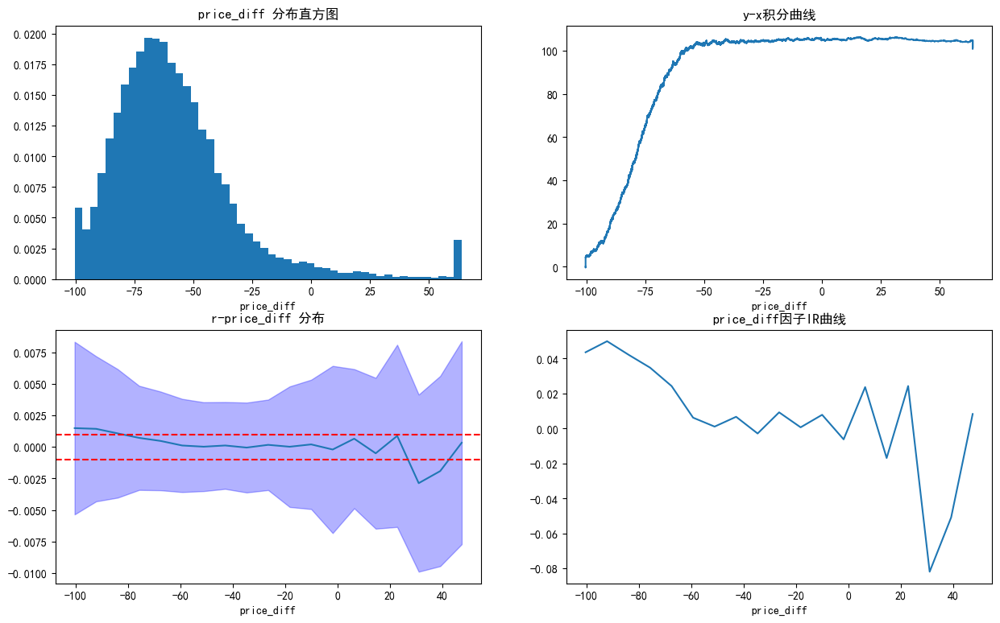

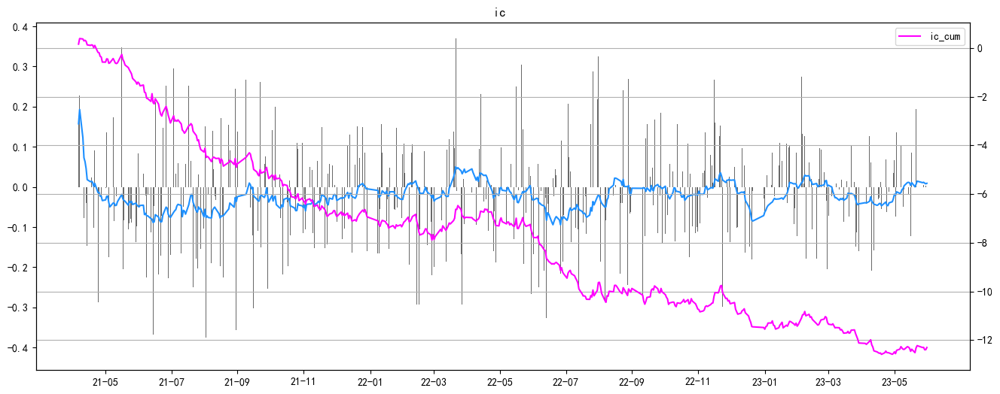

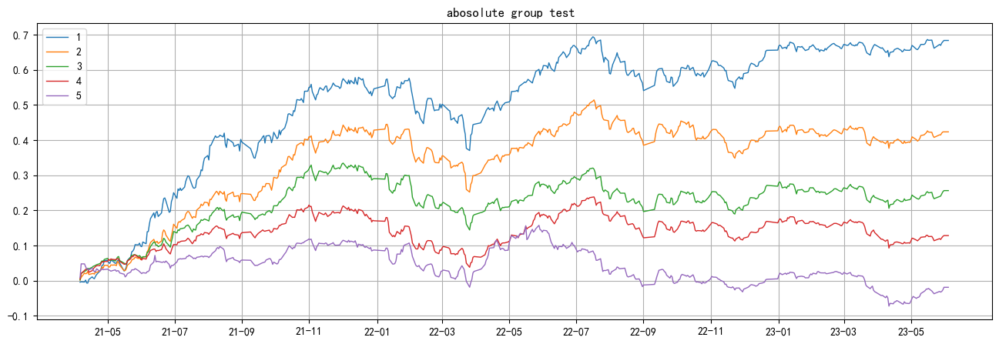

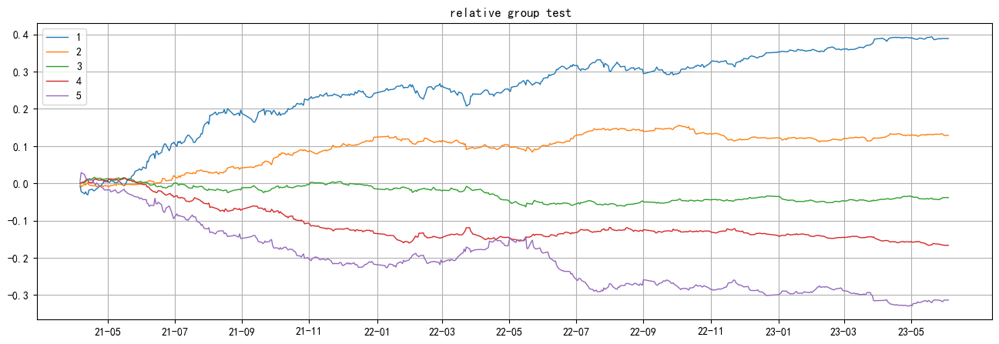

In [15]:
look(data,factor,r,thresh=0.01, div_num=20)
analyse_ic(data,factor,r)    
analyse_group_new(data,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data,factor,r,is_alpha=True,num_group=5)

### Categorize by close

In [5]:
data['close1'] = data.groupby(['date'])['close'].transform(lambda x:x.quantile(0.25))#计算每个日期对应的四分位数
data['close2'] = data.groupby(['date'])['close'].transform(lambda x:x.quantile(0.75))
data1 = data[data['close']<data['close1']]
data2 = data[(data['close']>=data['close1'])&(data['close']<data['close2'])]
data3 = data[data['close']>=data['close2']]

<Figure size 1500x1200 with 0 Axes>

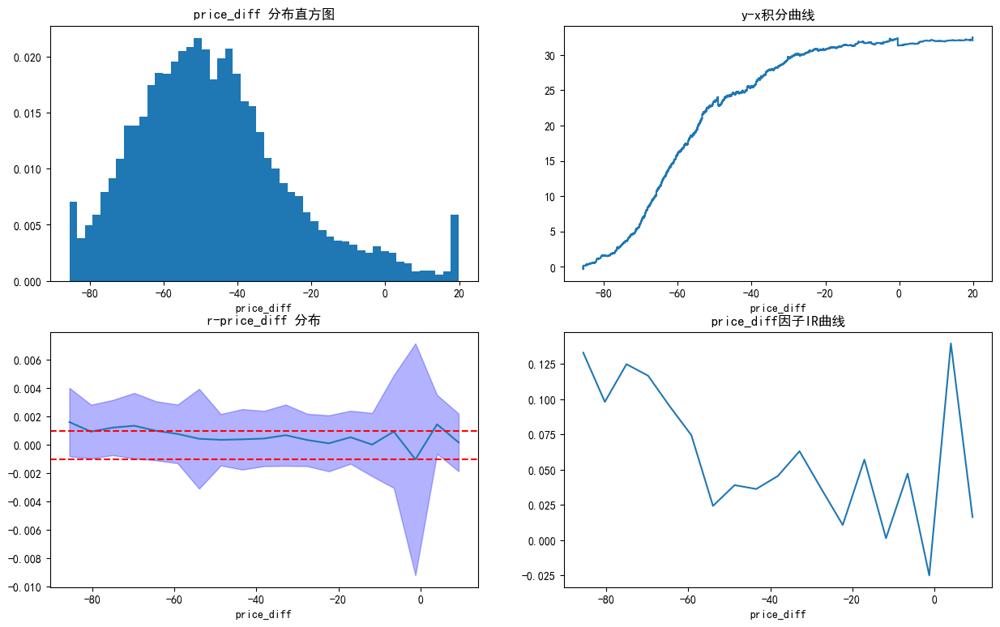

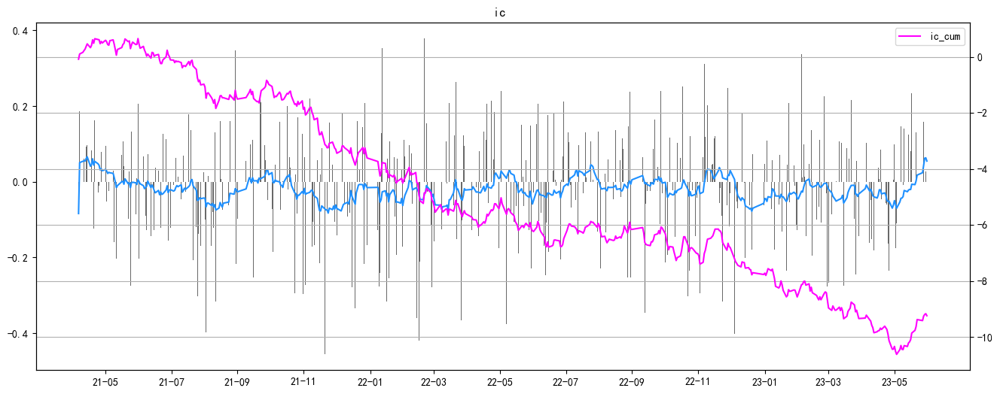

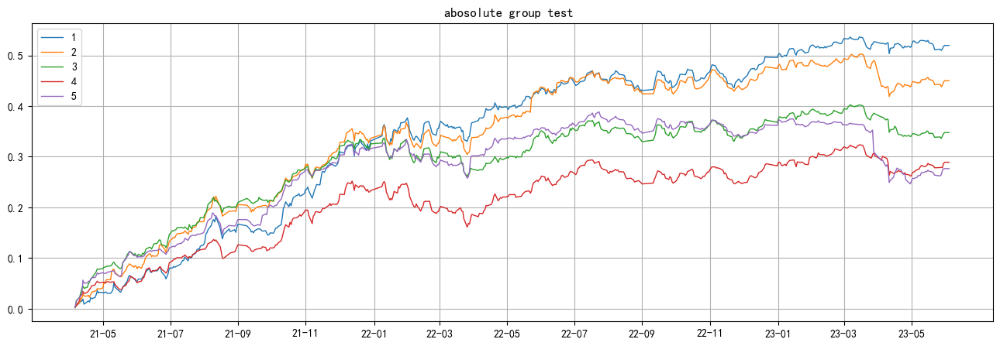

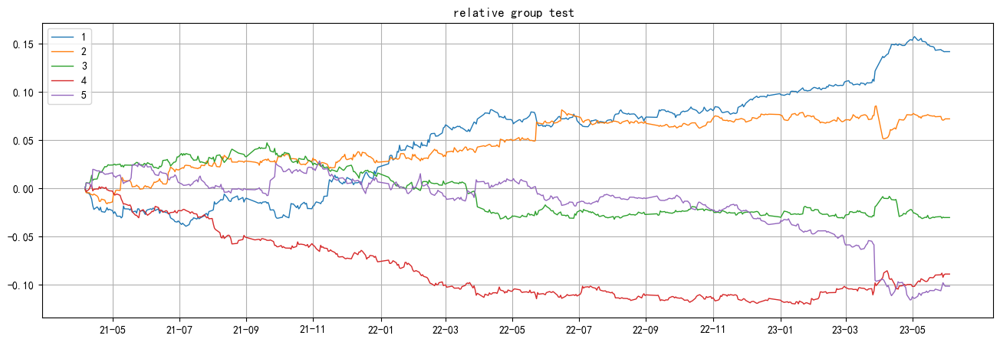

In [56]:
look(data1,factor,r,thresh=0.01, div_num=20)
analyse_ic(data1,factor,r)    
analyse_group_new(data1,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data1,factor,r,is_alpha=True,num_group=5)

<Figure size 1500x1200 with 0 Axes>

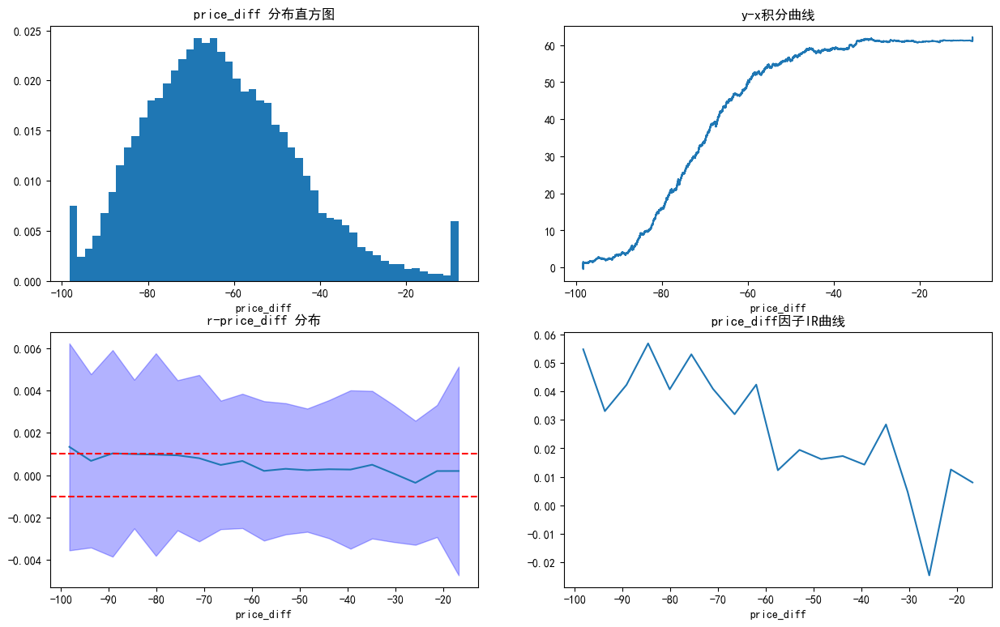

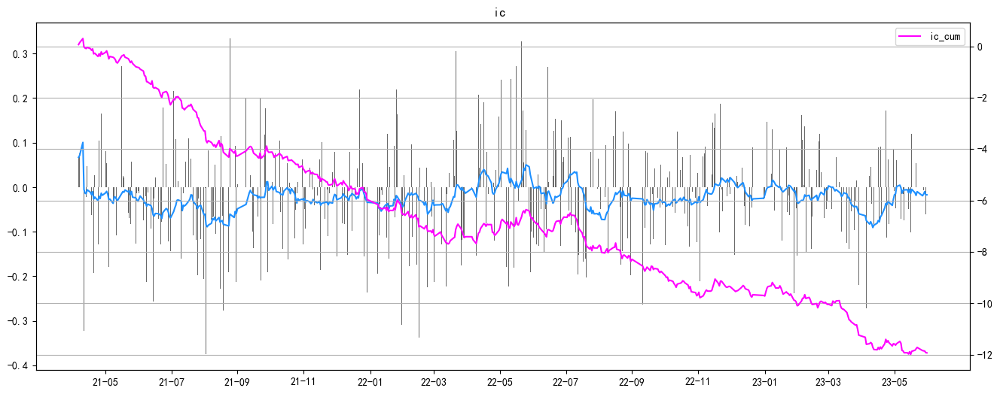

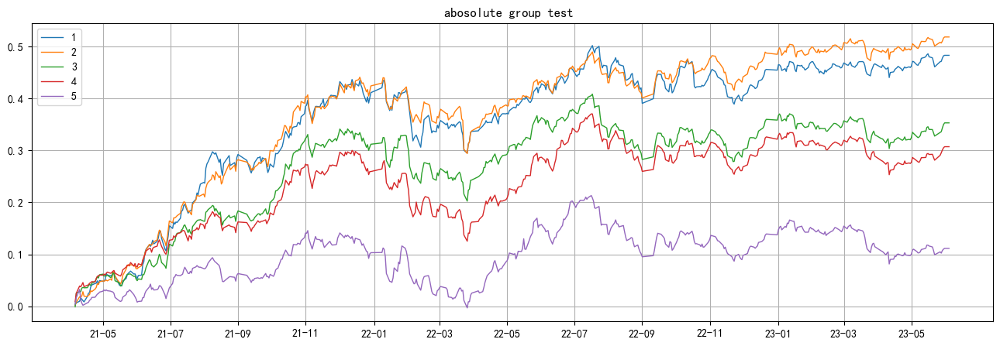

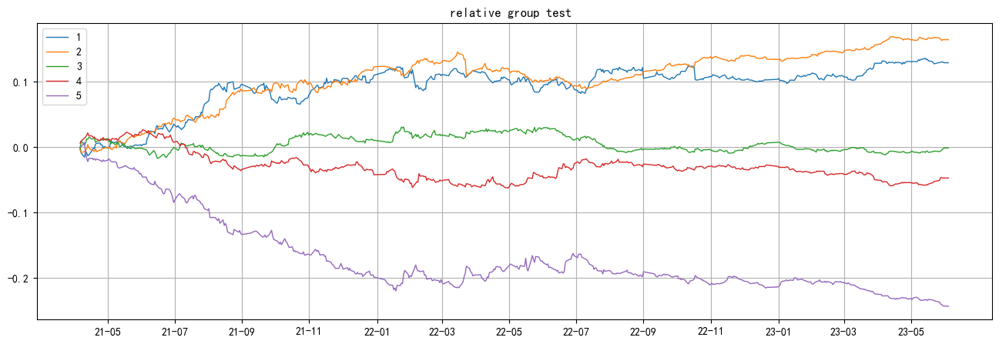

In [58]:
look(data2,factor,r,thresh=0.01, div_num=20)
analyse_ic(data2,factor,r)    
analyse_group_new(data2,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data2,factor,r,is_alpha=True,num_group=5)

<Figure size 1500x1200 with 0 Axes>

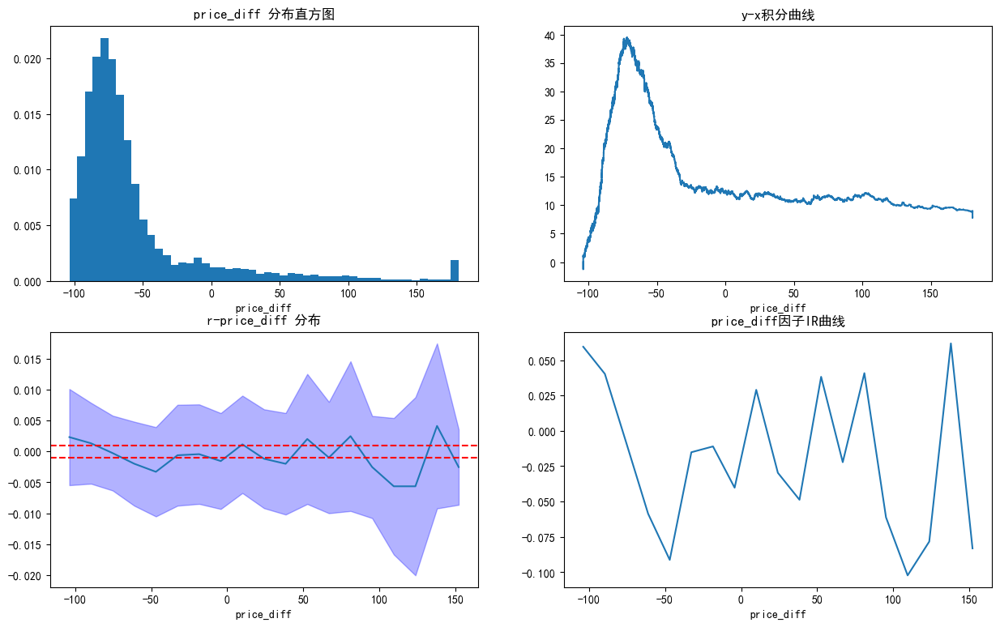

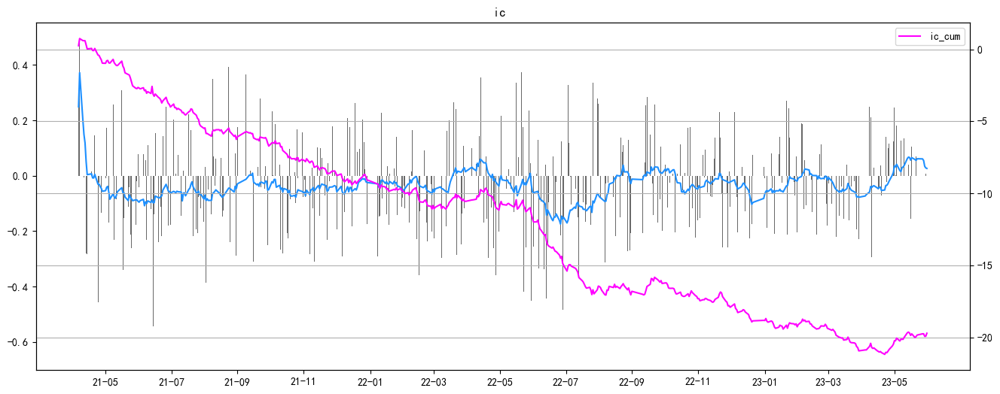

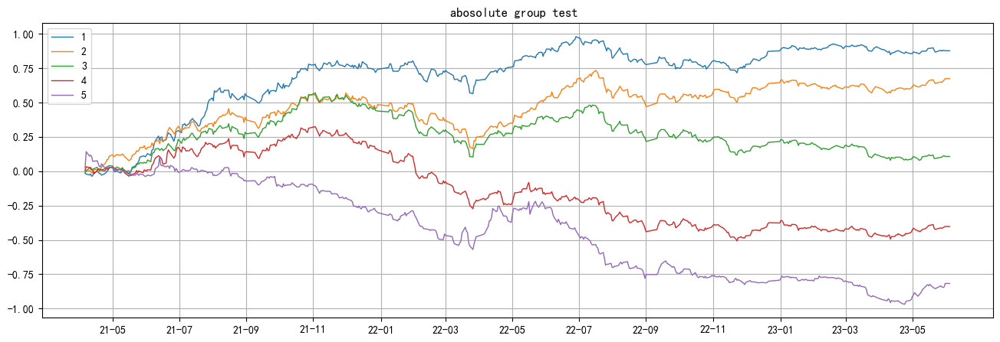

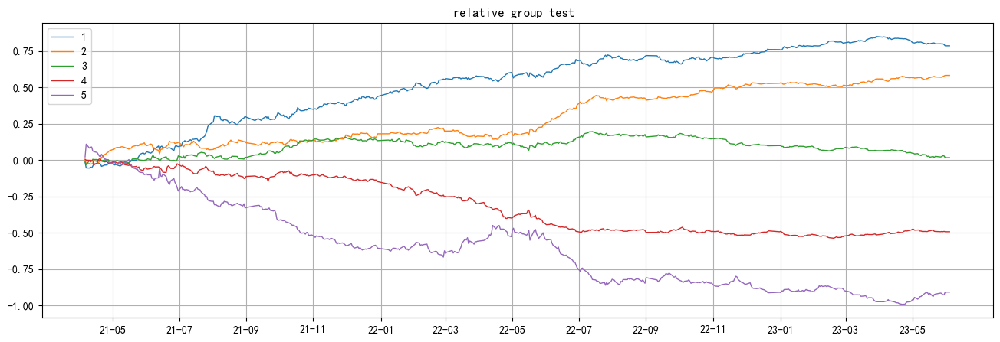

In [59]:
look(data3,factor,r,thresh=0.01, div_num=20)
analyse_ic(data3,factor,r)    
analyse_group_new(data3,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data3,factor,r,is_alpha=True,num_group=5)

### Categorize by conversion_value

In [61]:
data['conversion_value1'] = data.groupby(['date'])['conversion_value'].transform(lambda x:x.quantile(0.25))#计算每个日期对应的四分位数
data['conversion_value2'] = data.groupby(['date'])['conversion_value'].transform(lambda x:x.quantile(0.75))
data4 = data[data['conversion_value']<data['conversion_value1']]
data5 = data[(data['conversion_value']>=data['conversion_value1'])&(data['conversion_value']<data['conversion_value2'])]
data6 = data[data['conversion_value']>=data['conversion_value2']]

<Figure size 1500x1200 with 0 Axes>

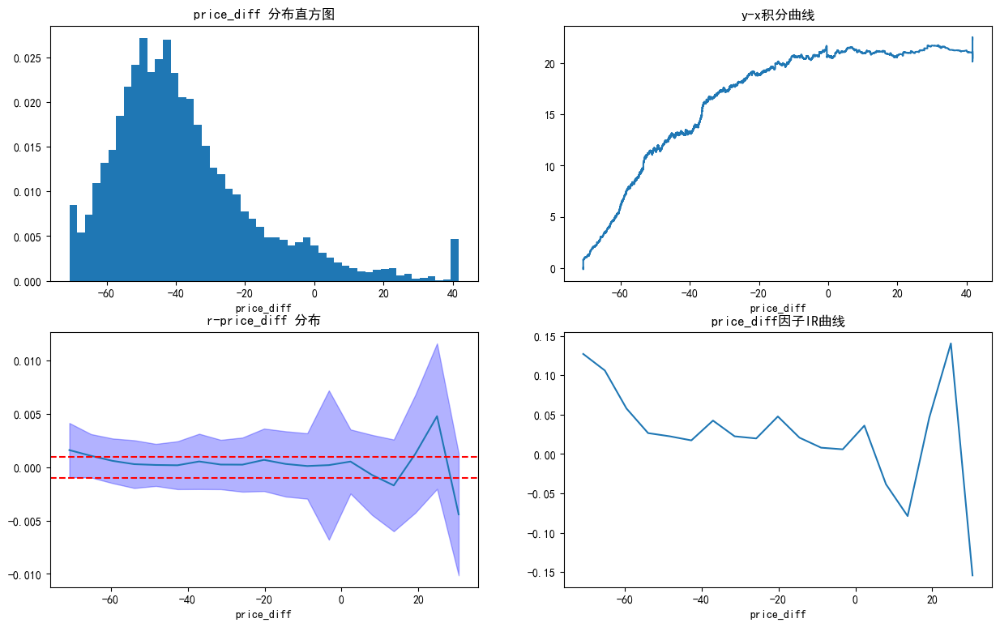

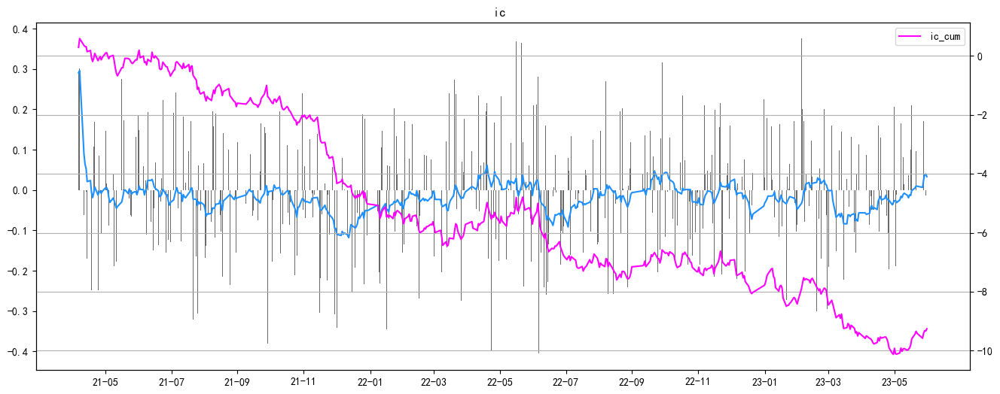

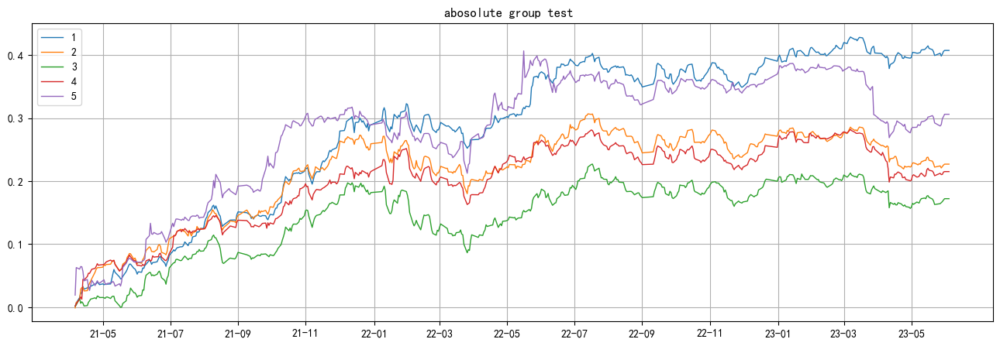

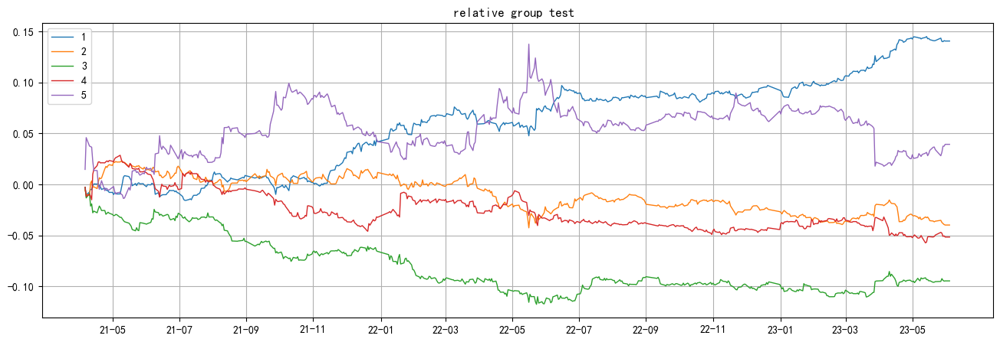

In [63]:
look(data4,factor,r,thresh=0.01, div_num=20)
analyse_ic(data4,factor,r)    
analyse_group_new(data4,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data4,factor,r,is_alpha=True,num_group=5)

<Figure size 1500x1200 with 0 Axes>

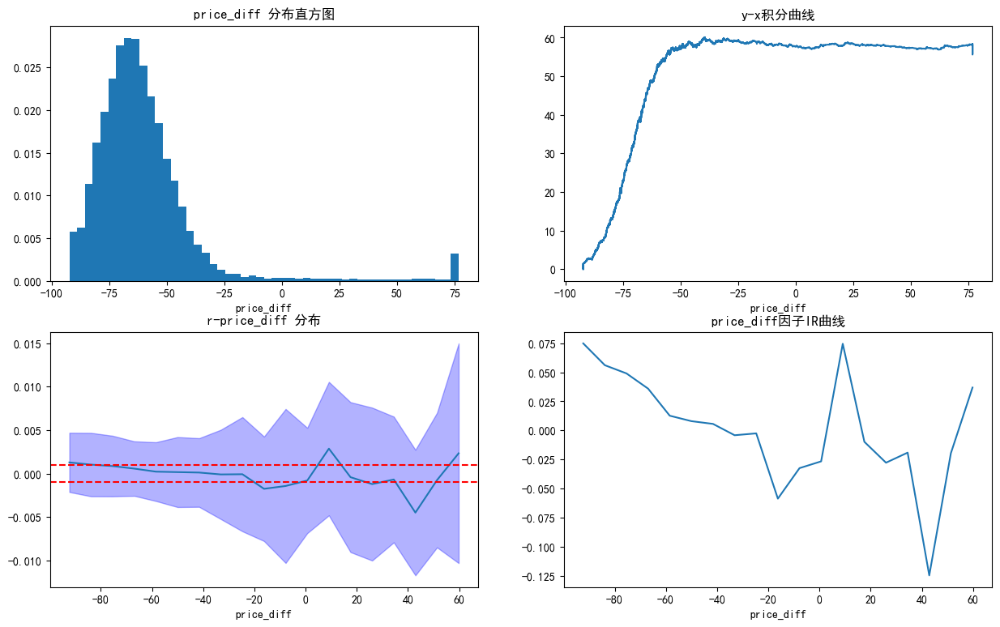

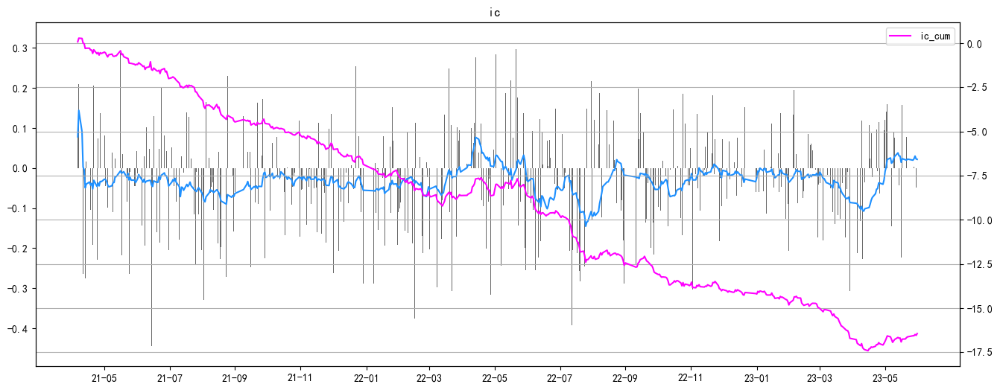

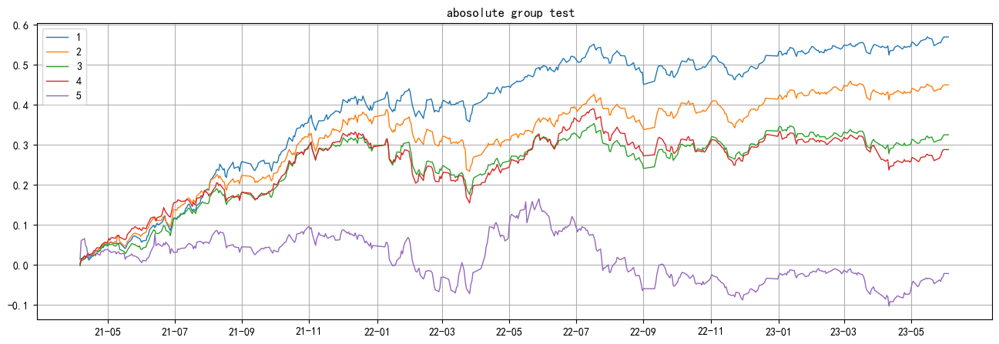

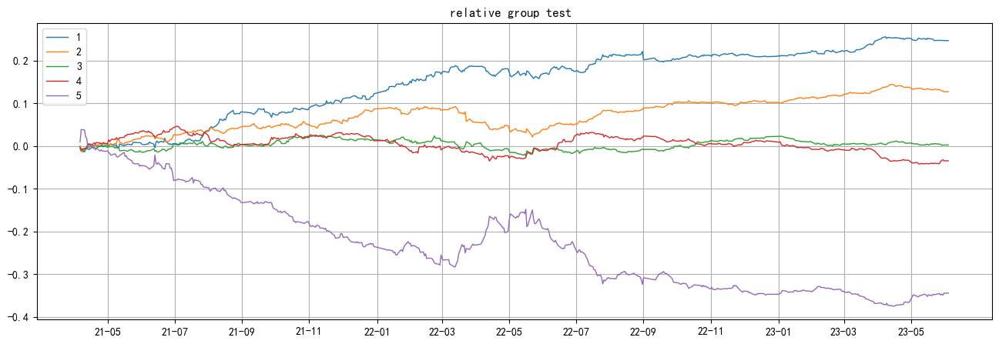

In [64]:
look(data5,factor,r,thresh=0.01, div_num=20)
analyse_ic(data5,factor,r)    
analyse_group_new(data5,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data5,factor,r,is_alpha=True,num_group=5)

<Figure size 1500x1200 with 0 Axes>

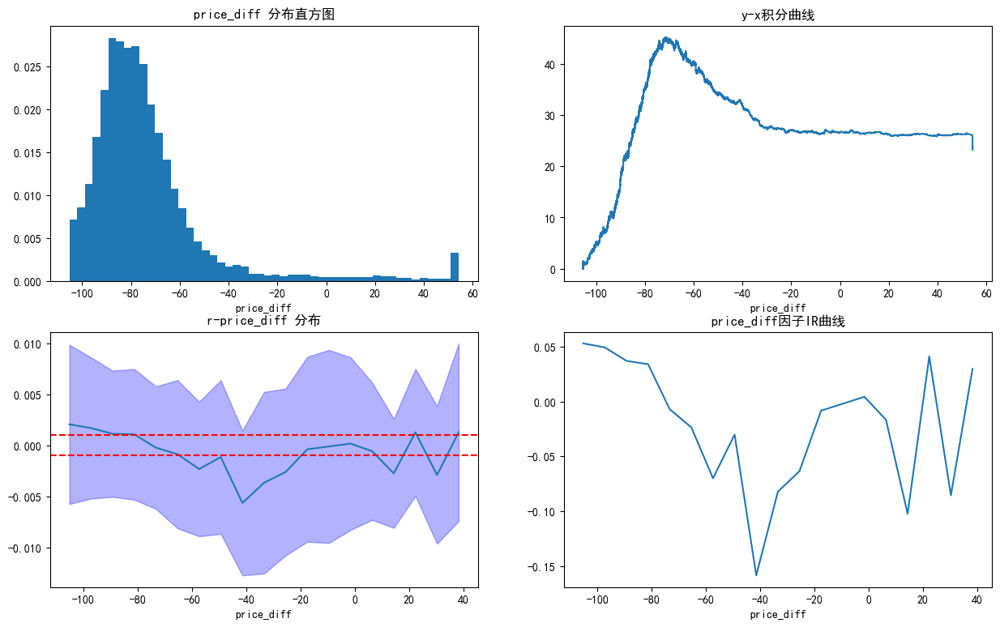

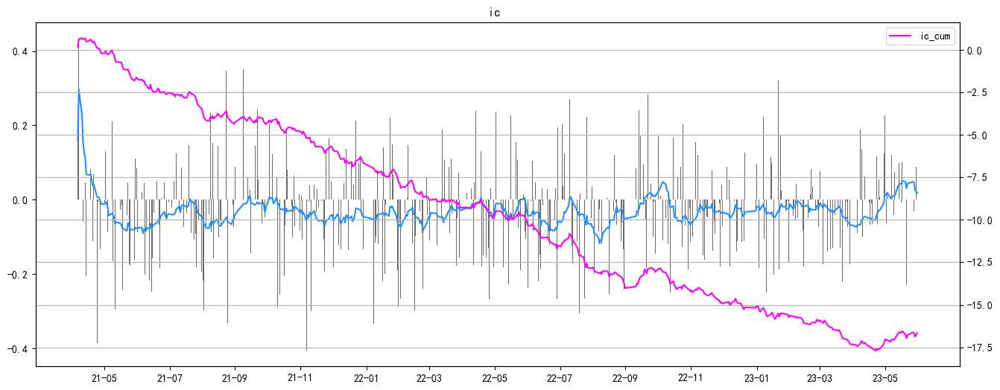

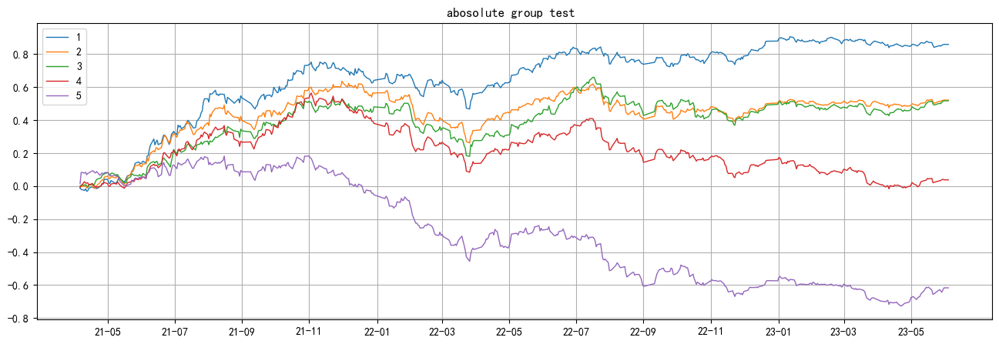

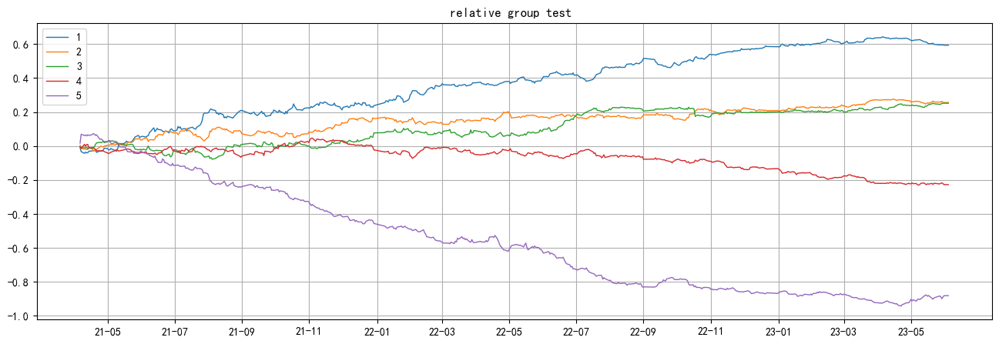

In [65]:
look(data6,factor,r,thresh=0.01, div_num=20)
analyse_ic(data6,factor,r)    
analyse_group_new(data6,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data6,factor,r,is_alpha=True,num_group=5)

### Categorize by conversion_premium

In [68]:
data['conversion_premium1'] = data.groupby(['date'])['conversion_premium'].transform(lambda x:x.quantile(0.25))#计算每个日期对应的四分位数
data['conversion_premium2'] = data.groupby(['date'])['conversion_premium'].transform(lambda x:x.quantile(0.75))
data7 = data[data['conversion_premium']<data['conversion_premium1']]
data8 = data[(data['conversion_premium']>=data['conversion_premium1'])&(data['conversion_premium']<data['conversion_premium2'])]
data9 = data[data['conversion_premium']>=data['conversion_premium2']]

<Figure size 1500x1200 with 0 Axes>

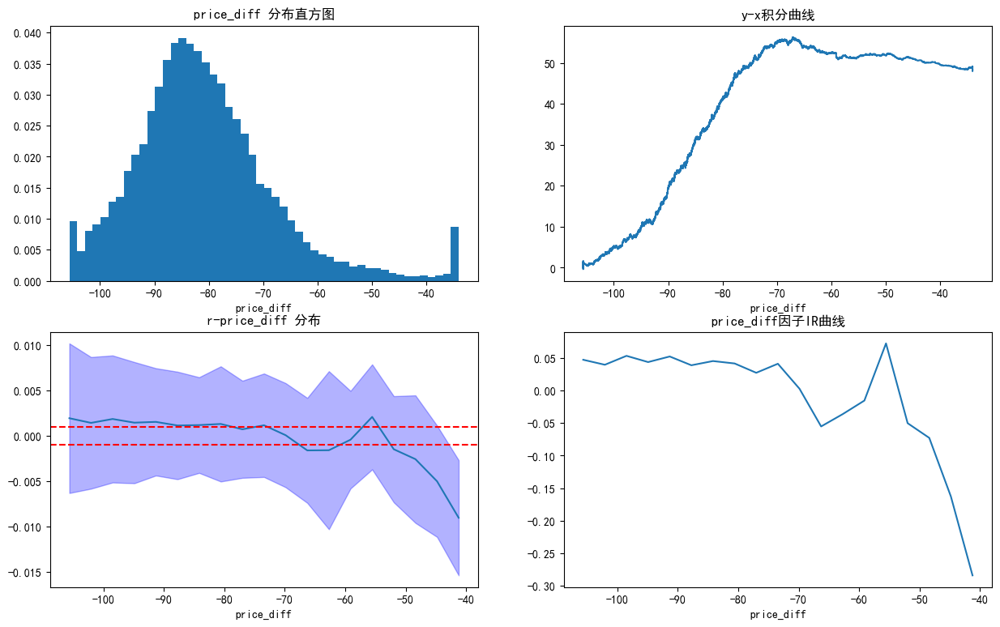

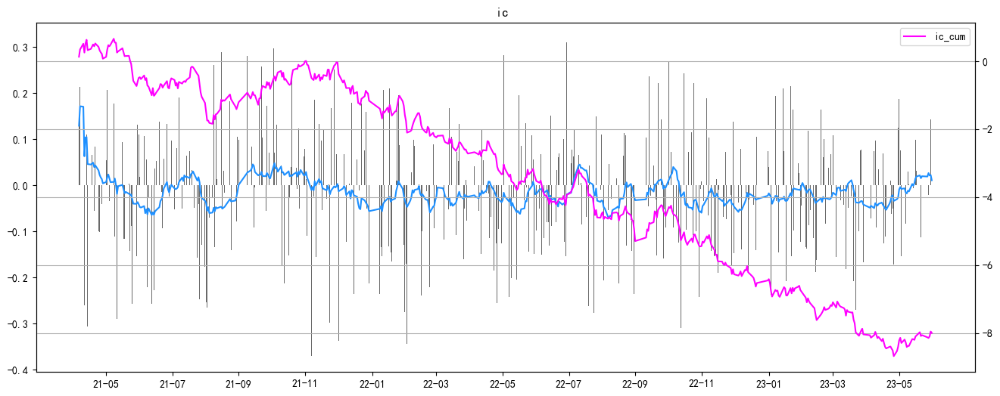

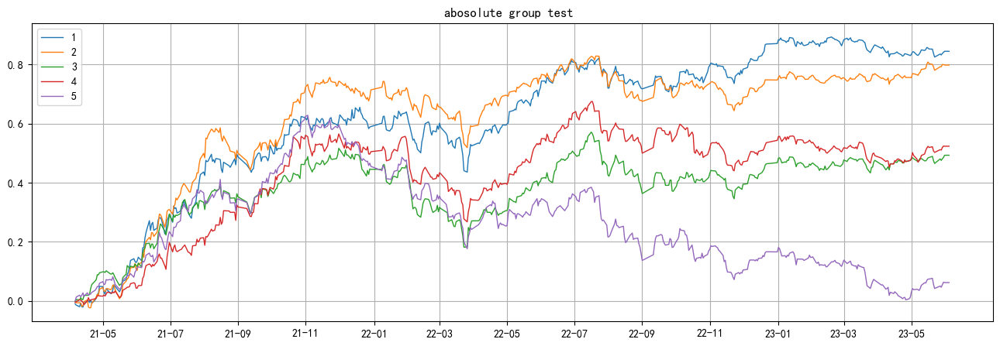

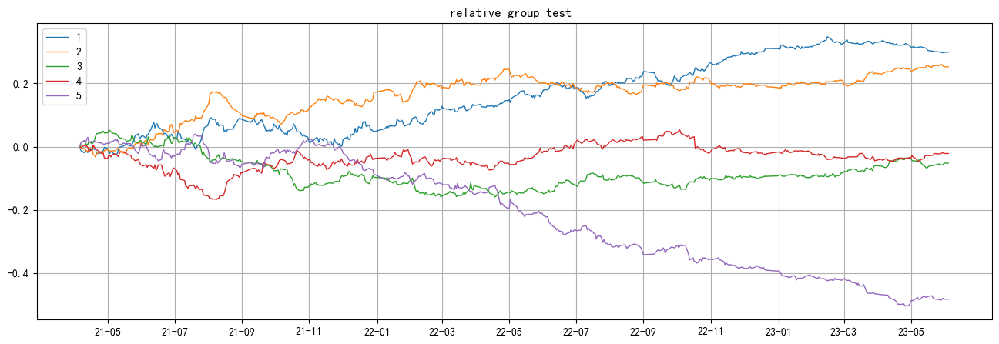

In [69]:
look(data7,factor,r,thresh=0.01, div_num=20)
analyse_ic(data7,factor,r)    
analyse_group_new(data7,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data7,factor,r,is_alpha=True,num_group=5)

<Figure size 1500x1200 with 0 Axes>

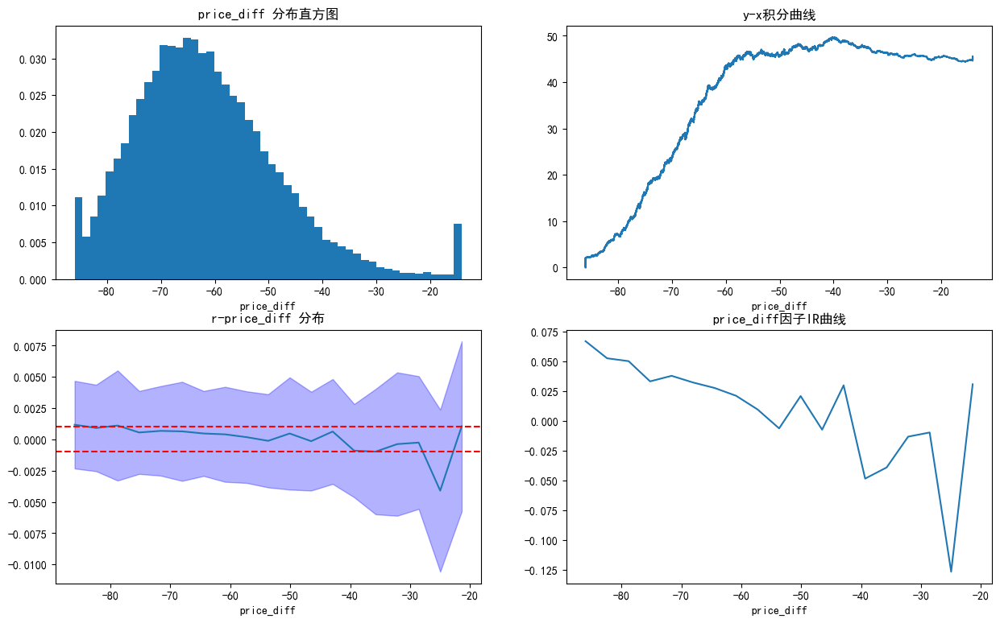

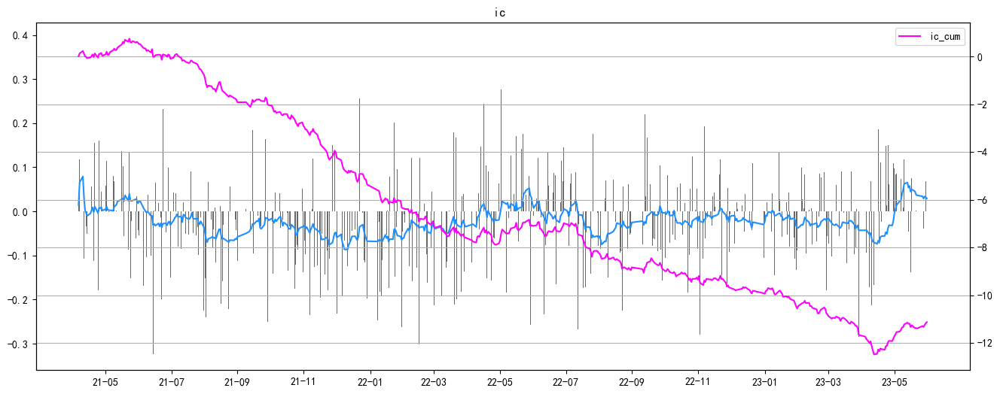

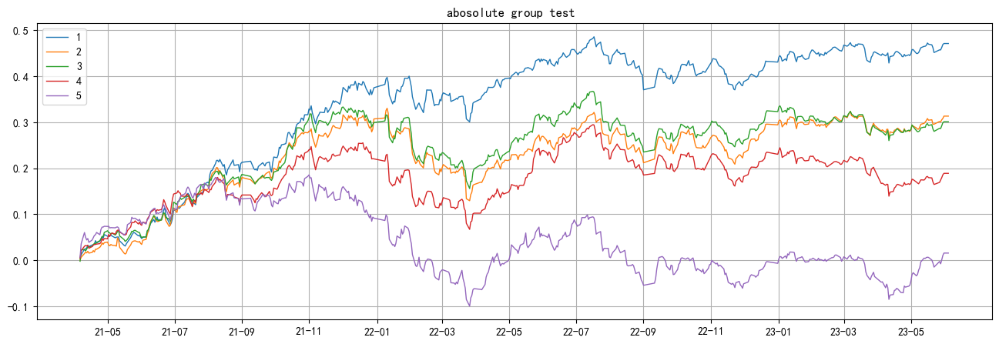

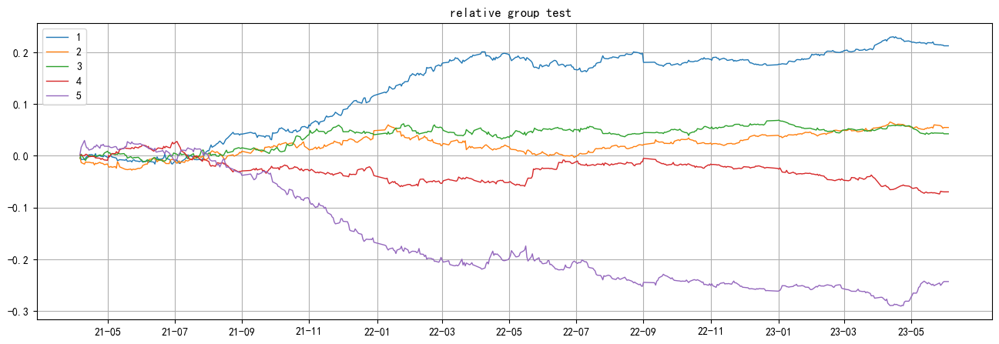

In [70]:
look(data8,factor,r,thresh=0.01, div_num=20)
analyse_ic(data8,factor,r)    
analyse_group_new(data8,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data8,factor,r,is_alpha=True,num_group=5)

<Figure size 1500x1200 with 0 Axes>

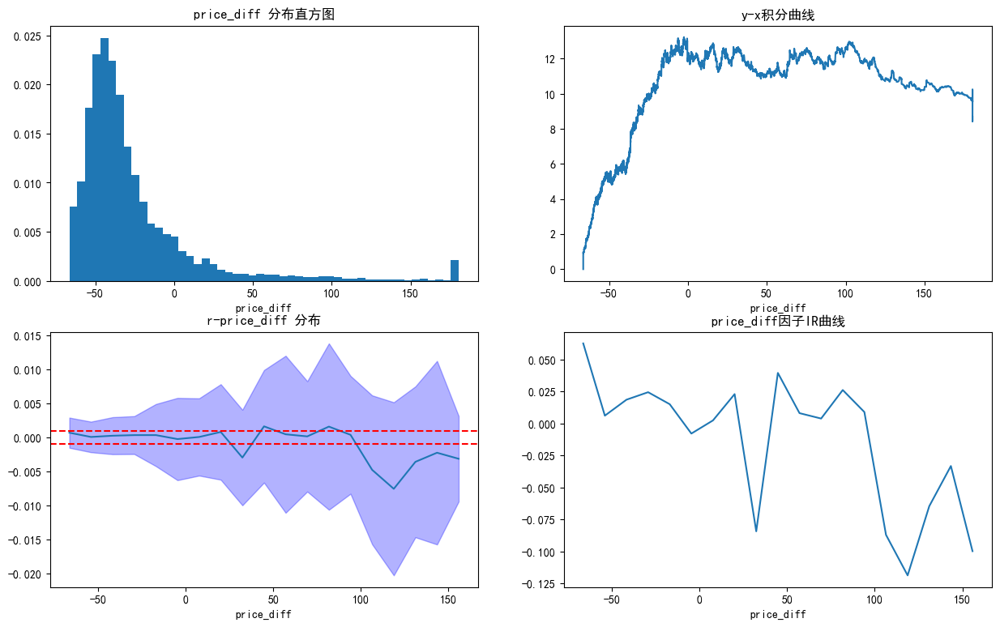

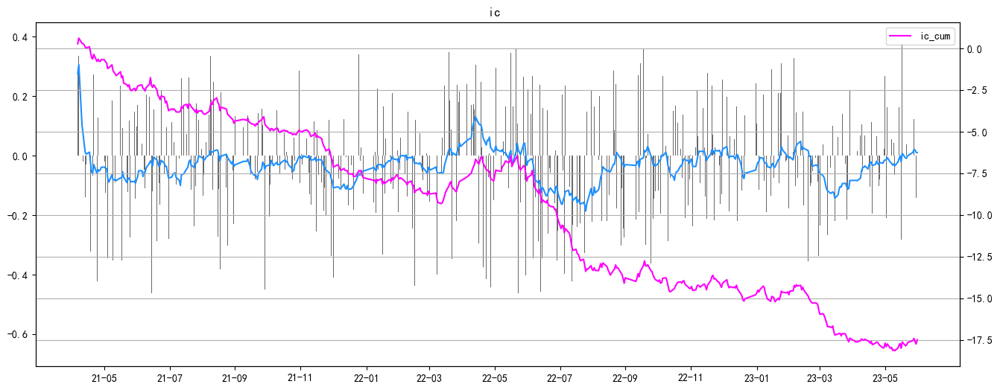

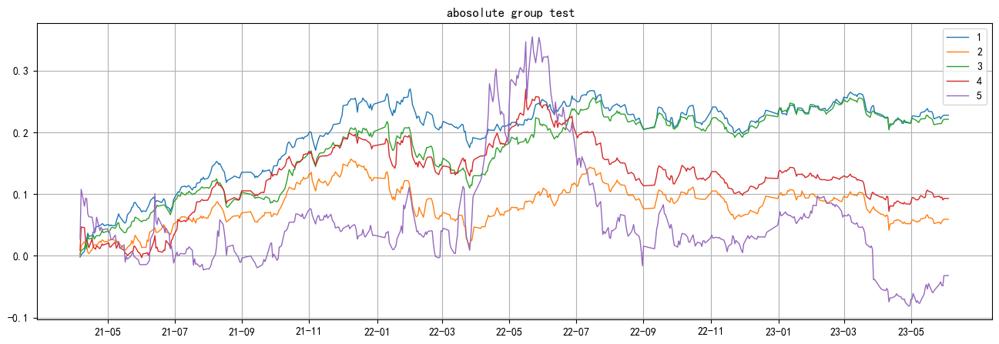

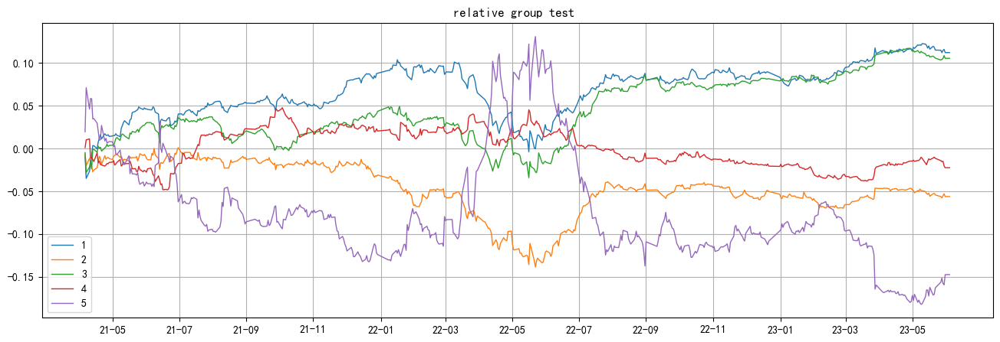

In [72]:
look(data9,factor,r,thresh=0.01, div_num=20)
analyse_ic(data9,factor,r)    
analyse_group_new(data9,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data9,factor,r,is_alpha=True,num_group=5)

### Categorize by put_trigger_price

In [6]:
data['put_trigger_price1'] = data.groupby(['date'])['put_trigger_price'].transform(lambda x:x.quantile(0.25))#计算每个日期对应的四分位数
data['put_trigger_price2'] = data.groupby(['date'])['put_trigger_price'].transform(lambda x:x.quantile(0.75))
data10 = data[data['put_trigger_price']<data['put_trigger_price1']]
data11 = data[(data['put_trigger_price']>=data['put_trigger_price1'])&(data['put_trigger_price']<data['put_trigger_price2'])]
data12 = data[data['put_trigger_price']>=data['put_trigger_price2']]

<Figure size 1500x1200 with 0 Axes>

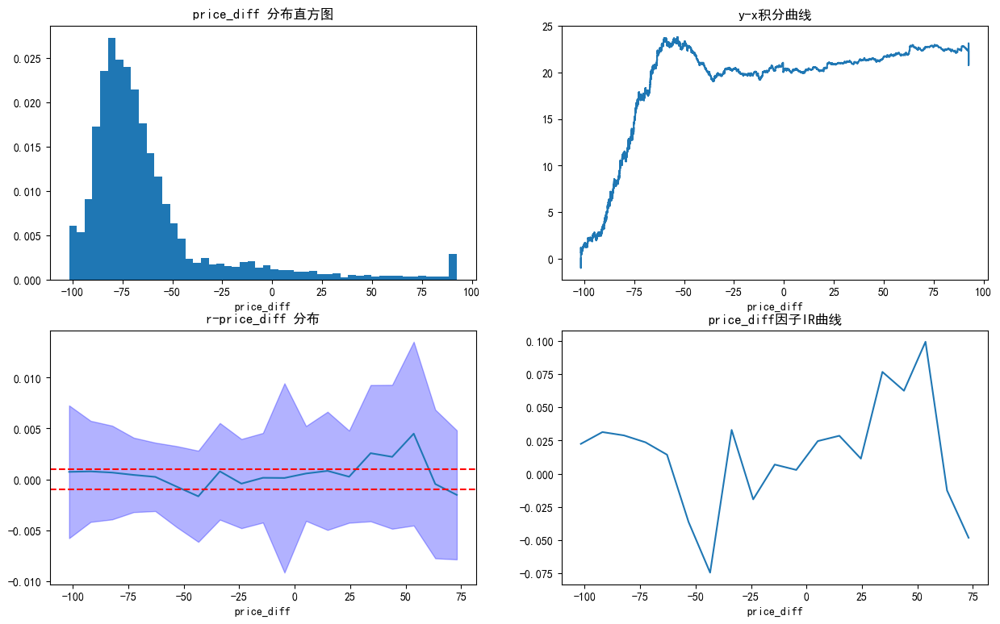

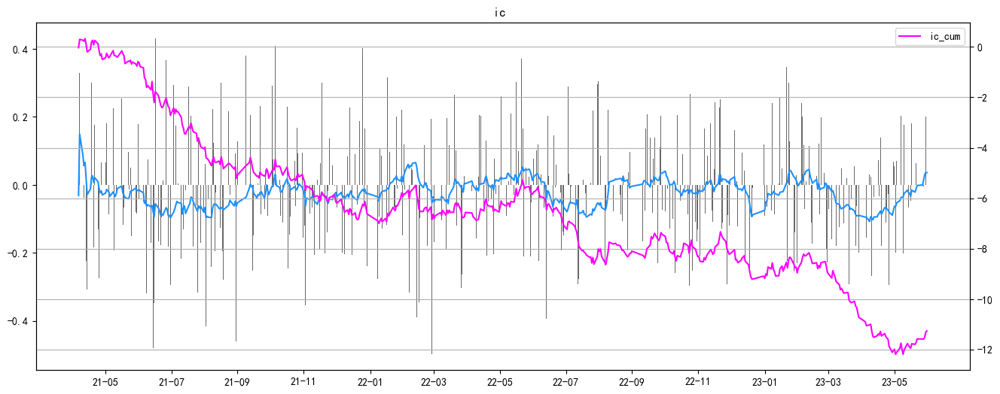

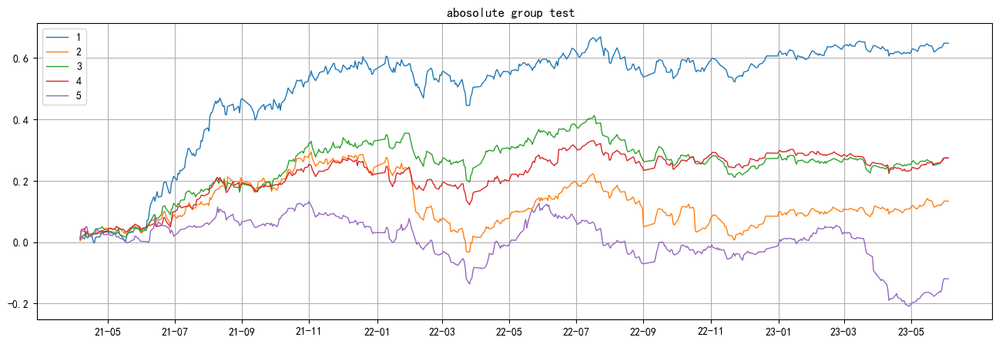

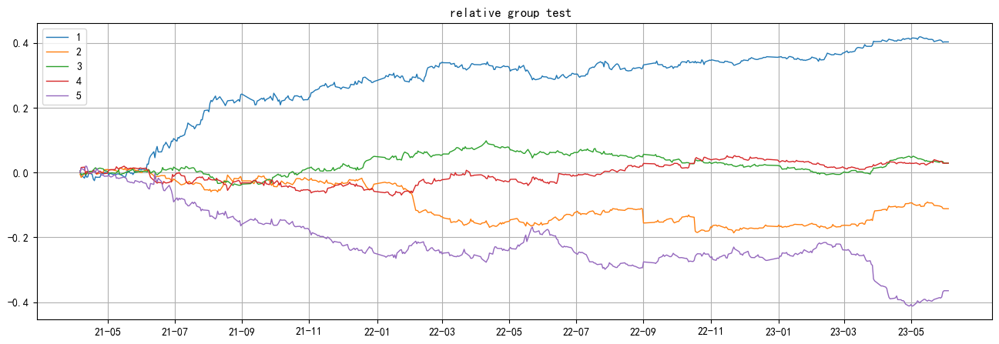

In [75]:
look(data10,factor,r,thresh=0.01, div_num=20)
analyse_ic(data10,factor,r)    
analyse_group_new(data10,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data10,factor,r,is_alpha=True,num_group=5)

<Figure size 1500x1200 with 0 Axes>

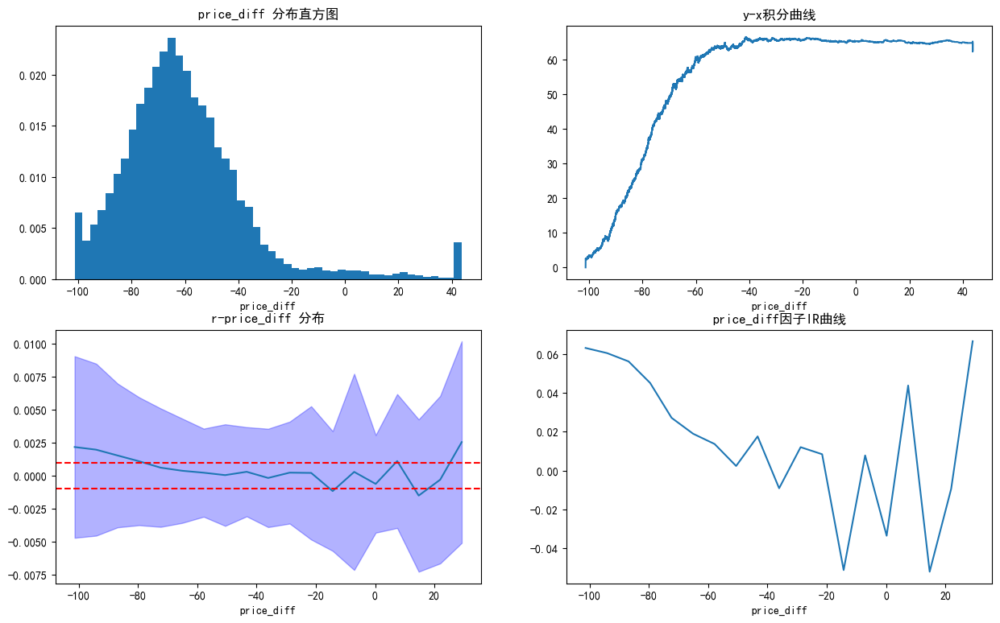

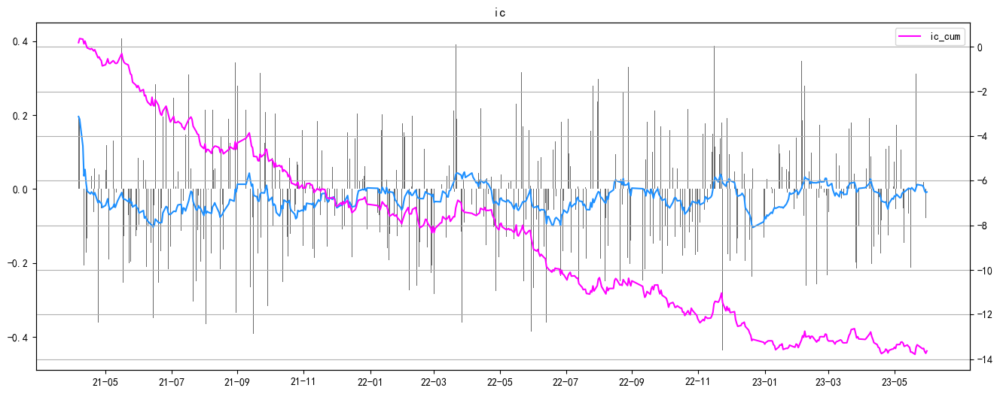

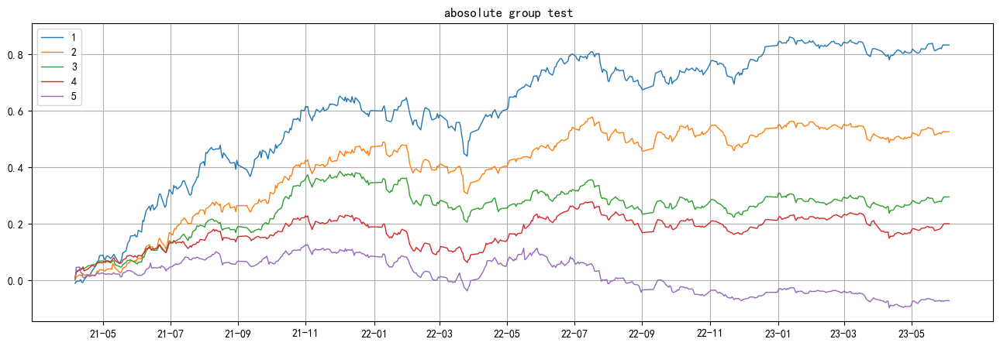

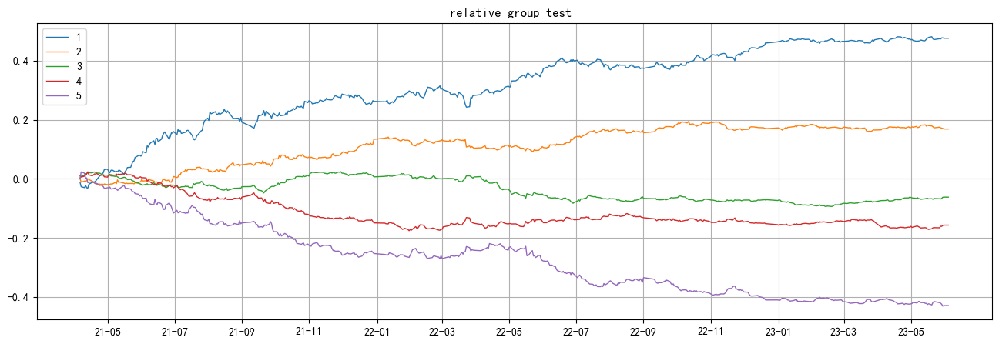

In [76]:
look(data11,factor,r,thresh=0.01, div_num=20)
analyse_ic(data11,factor,r)    
analyse_group_new(data11,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data11,factor,r,is_alpha=True,num_group=5)

<Figure size 1500x1200 with 0 Axes>

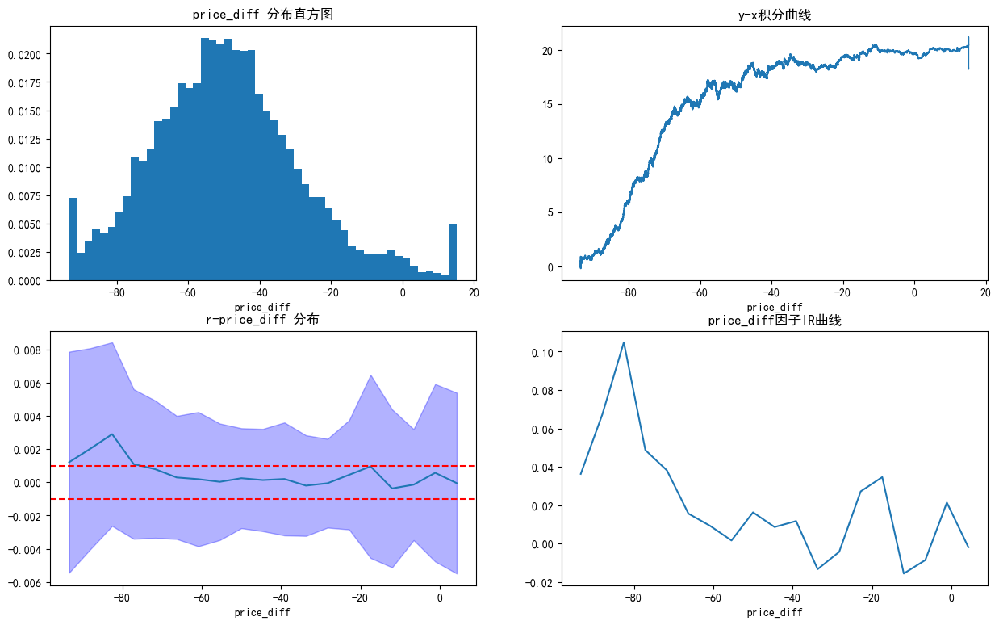

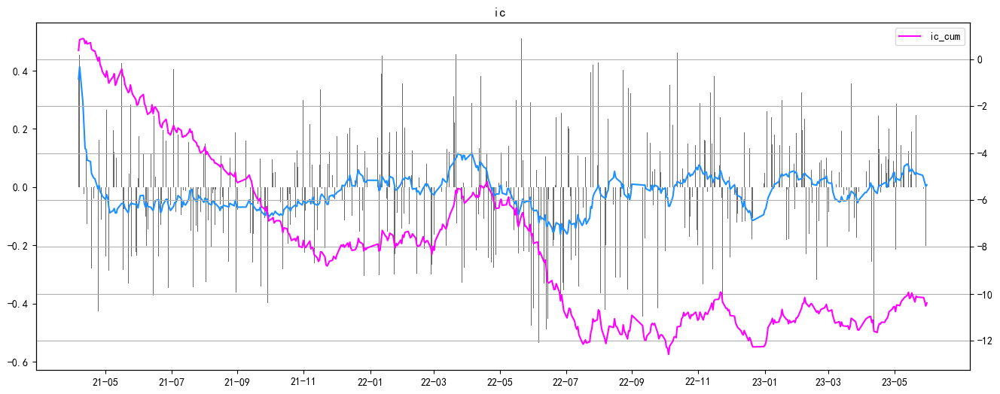

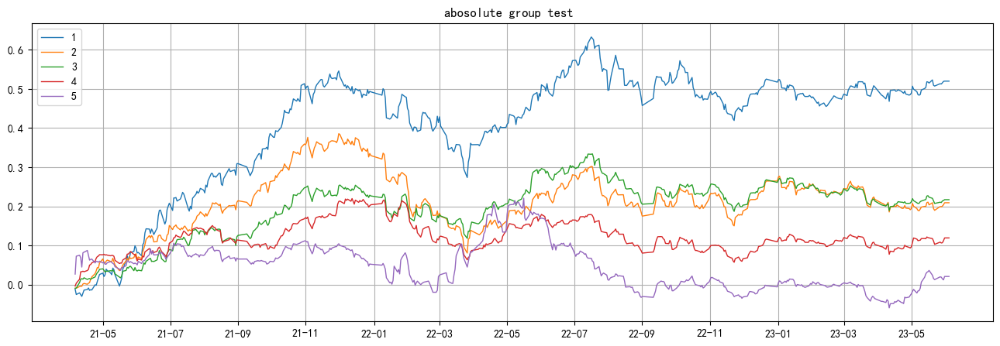

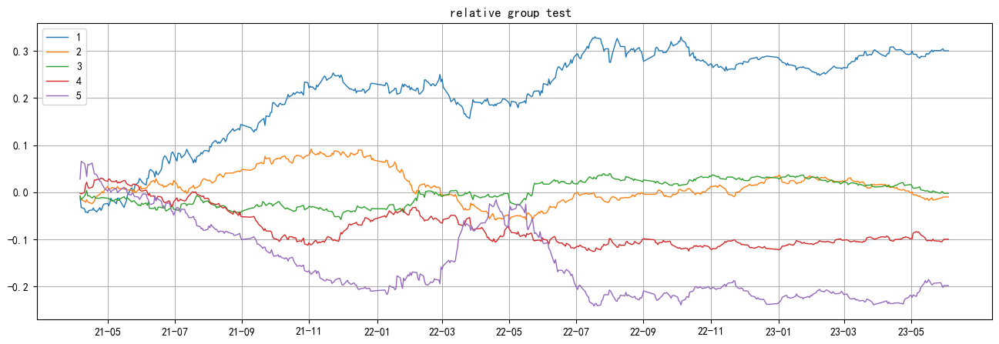

In [77]:
look(data12,factor,r,thresh=0.01, div_num=20)
analyse_ic(data12,factor,r)    
analyse_group_new(data12,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data12,factor,r,is_alpha=True,num_group=5)

### Categorize by yield_to_maturity

In [80]:
data['yield_to_maturity1'] = data.groupby(['date'])['yield_to_maturity'].transform(lambda x:x.quantile(0.25))#计算每个日期对应的四分位数
data['yield_to_maturity2'] = data.groupby(['date'])['yield_to_maturity'].transform(lambda x:x.quantile(0.75))
data13 = data[data['yield_to_maturity']<data['yield_to_maturity1']]
data14 = data[(data['yield_to_maturity']>=data['yield_to_maturity1'])&(data['yield_to_maturity']<data['yield_to_maturity2'])]
data15 = data[data['yield_to_maturity']>=data['yield_to_maturity2']]

<Figure size 1500x1200 with 0 Axes>

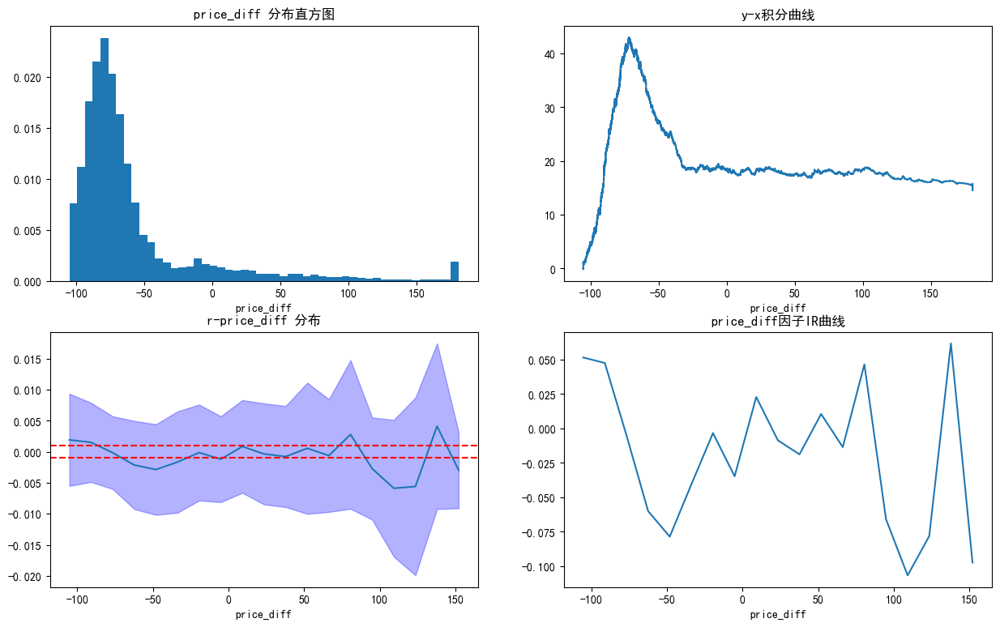

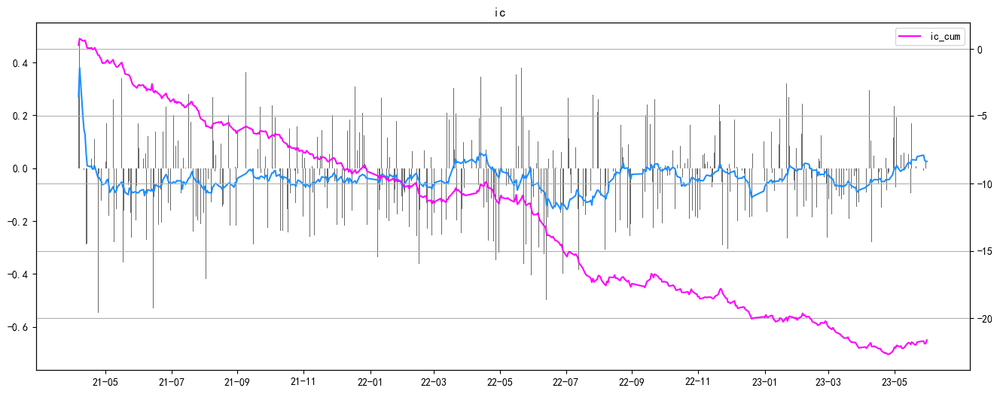

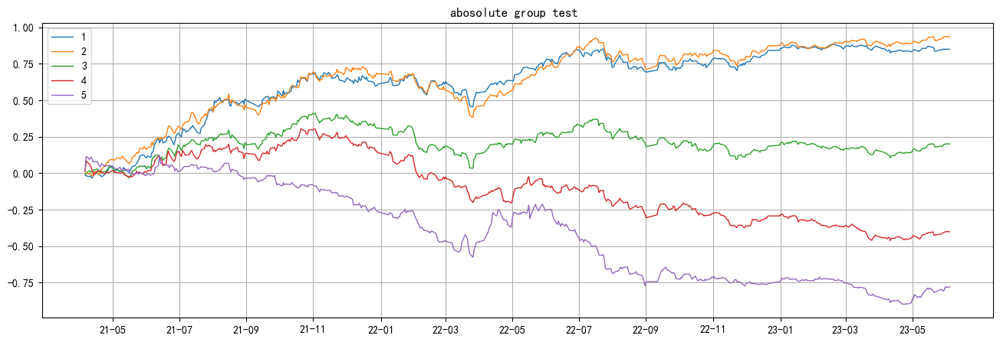

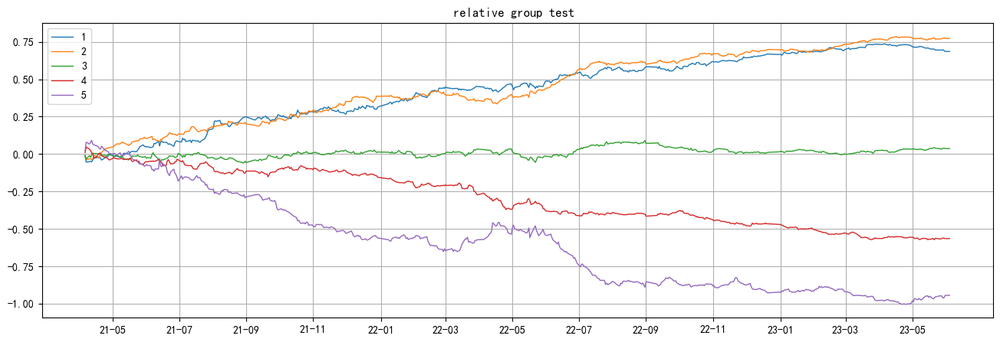

In [84]:
look(data13,factor,r,thresh=0.01, div_num=20)
analyse_ic(data13,factor,r)    
analyse_group_new(data13,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data13,factor,r,is_alpha=True,num_group=5)

<Figure size 1500x1200 with 0 Axes>

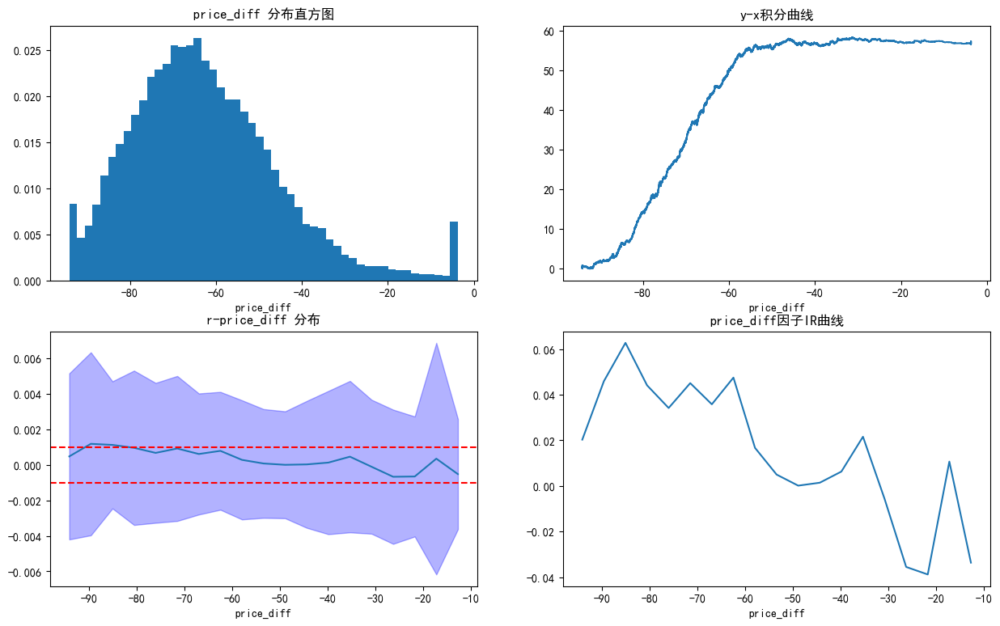

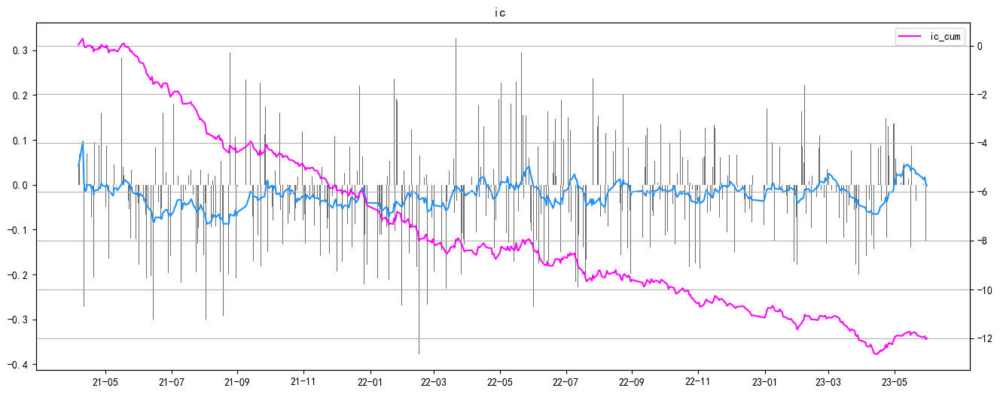

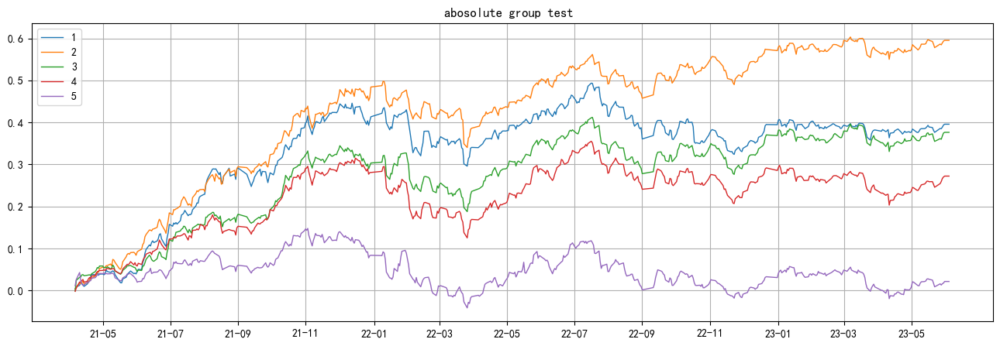

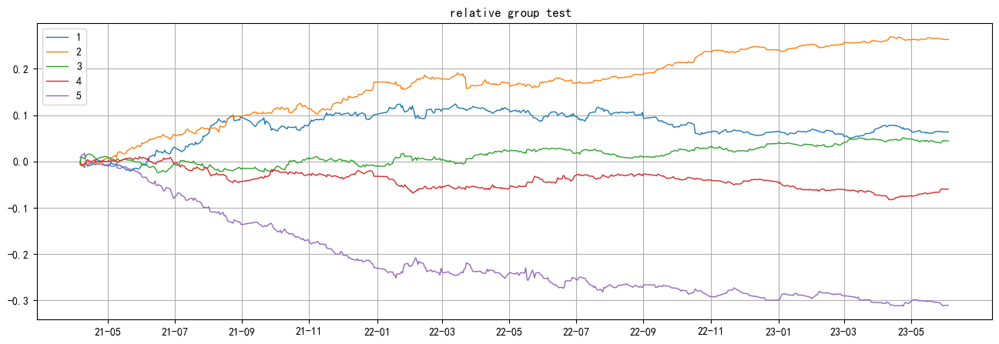

In [85]:
look(data14,factor,r,thresh=0.01, div_num=20)
analyse_ic(data14,factor,r)    
analyse_group_new(data14,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data14,factor,r,is_alpha=True,num_group=5)

<Figure size 1500x1200 with 0 Axes>

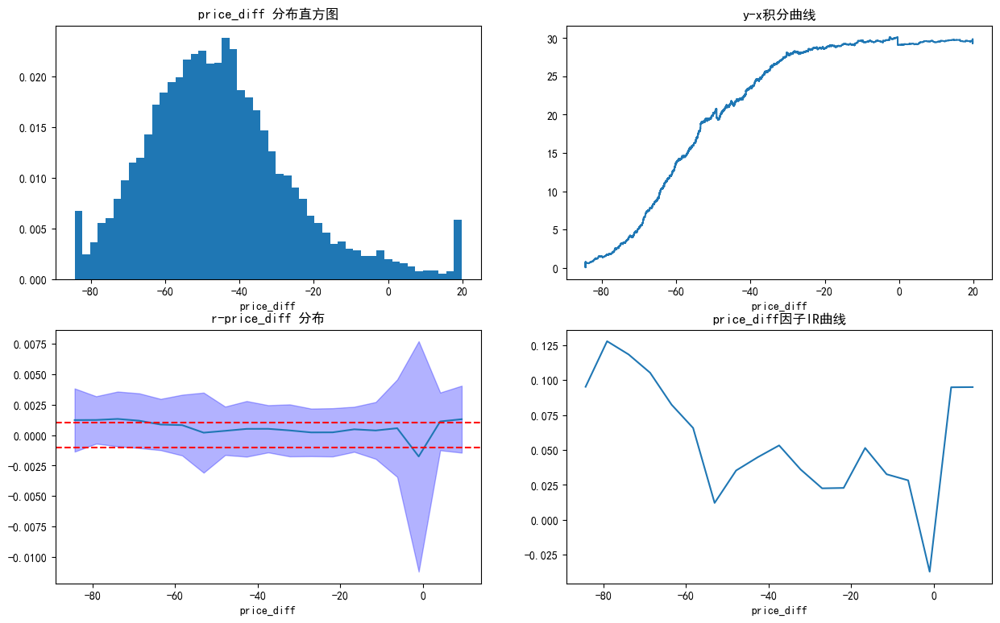

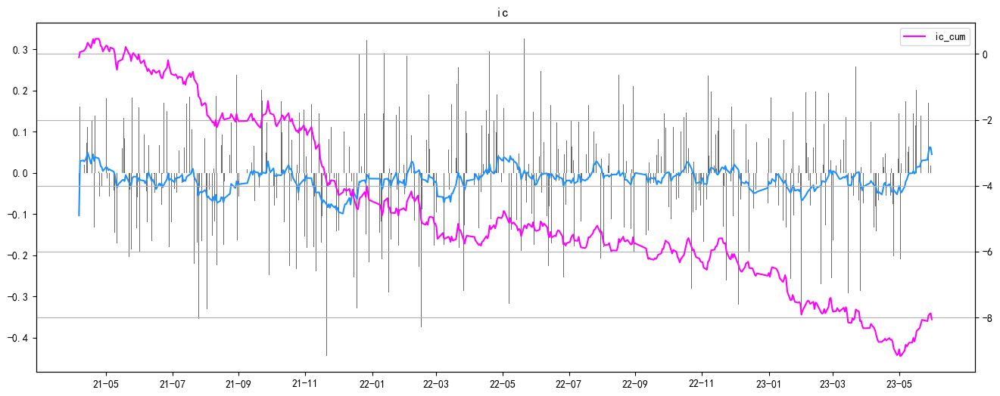

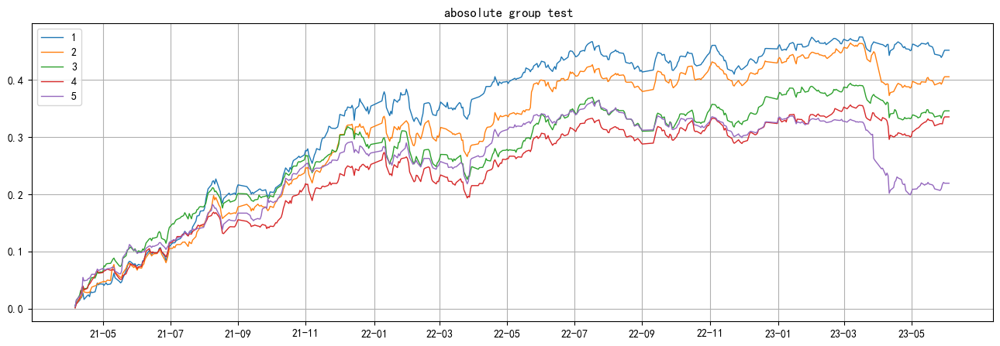

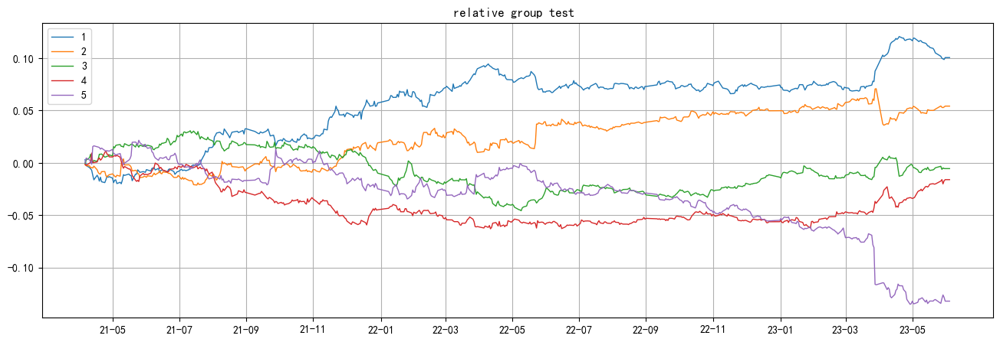

In [86]:
look(data15,factor,r,thresh=0.01, div_num=20)
analyse_ic(data15,factor,r)    
analyse_group_new(data15,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data15,factor,r,is_alpha=True,num_group=5)

### Categorize by pb_ratio

In [87]:
data['pb_ratio1'] = data.groupby(['date'])['pb_ratio'].transform(lambda x:x.quantile(0.25))#计算每个日期对应的四分位数
data['pb_ratio2'] = data.groupby(['date'])['pb_ratio'].transform(lambda x:x.quantile(0.75))
data16 = data[data['pb_ratio']<data['pb_ratio1']]
data17 = data[(data['pb_ratio']>=data['pb_ratio1'])&(data['pb_ratio']<data['pb_ratio2'])]
data18 = data[data['pb_ratio']>=data['pb_ratio2']]

<Figure size 1500x1200 with 0 Axes>

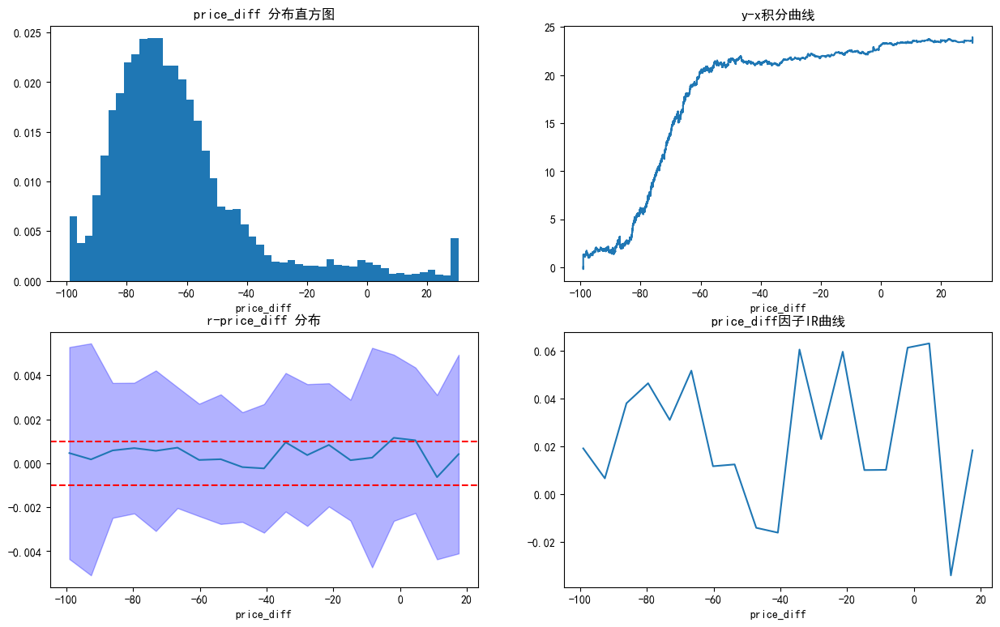

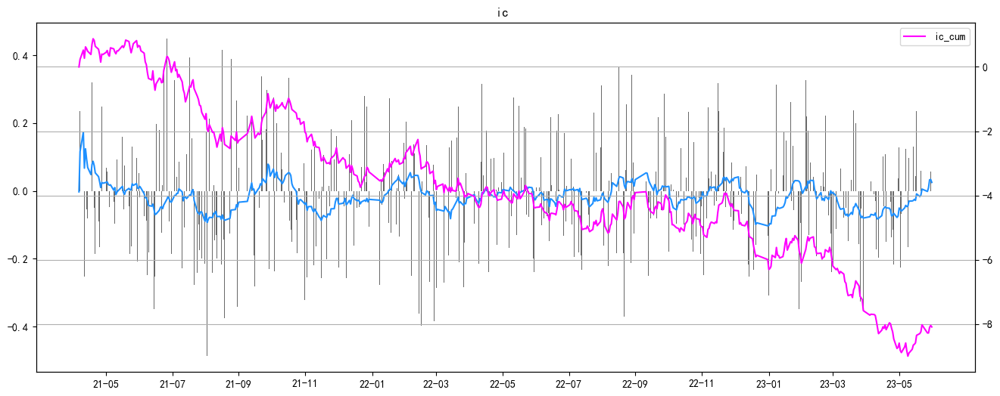

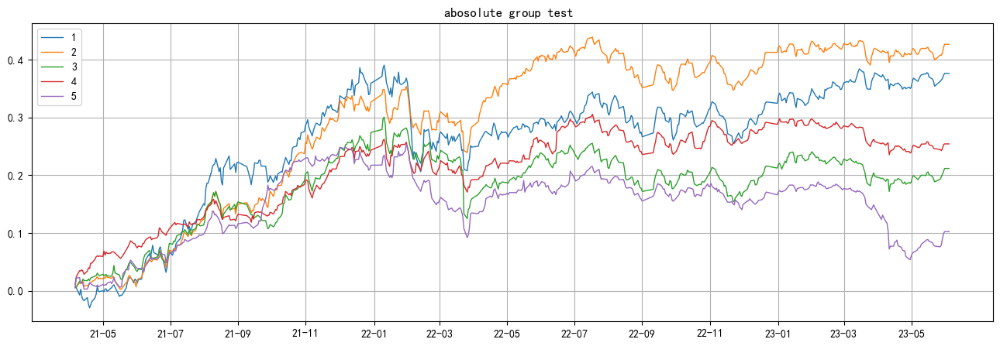

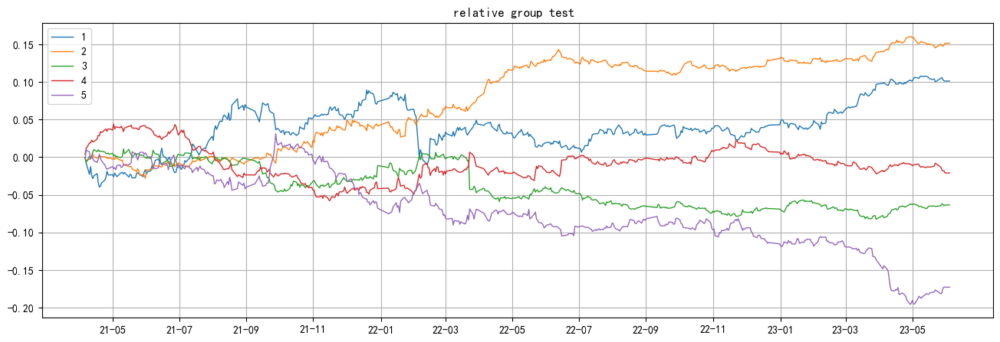

In [88]:
look(data16,factor,r,thresh=0.01, div_num=20)
analyse_ic(data16,factor,r)    
analyse_group_new(data16,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data16,factor,r,is_alpha=True,num_group=5)

<Figure size 1500x1200 with 0 Axes>

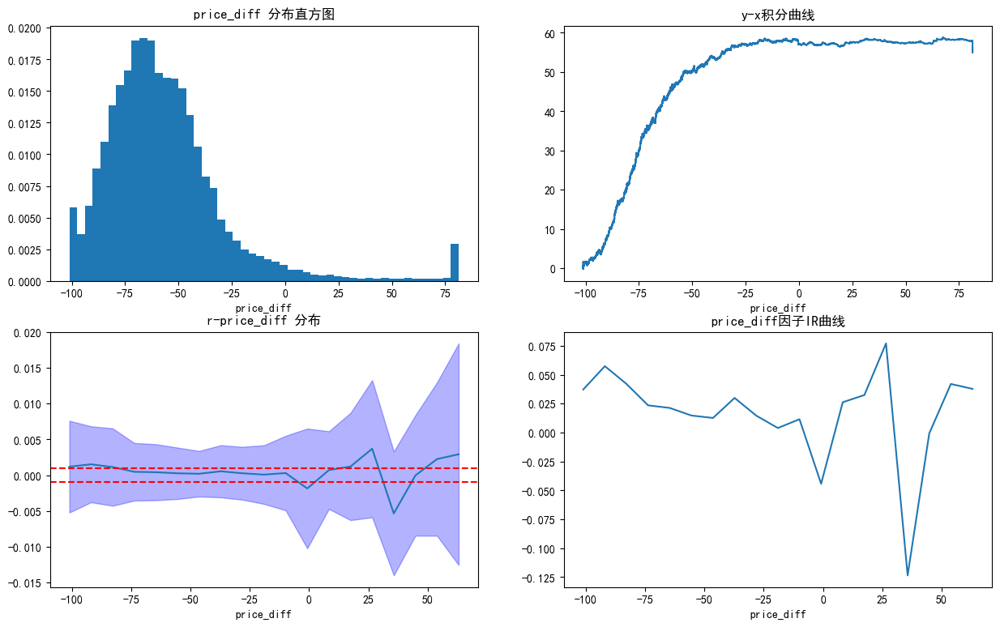

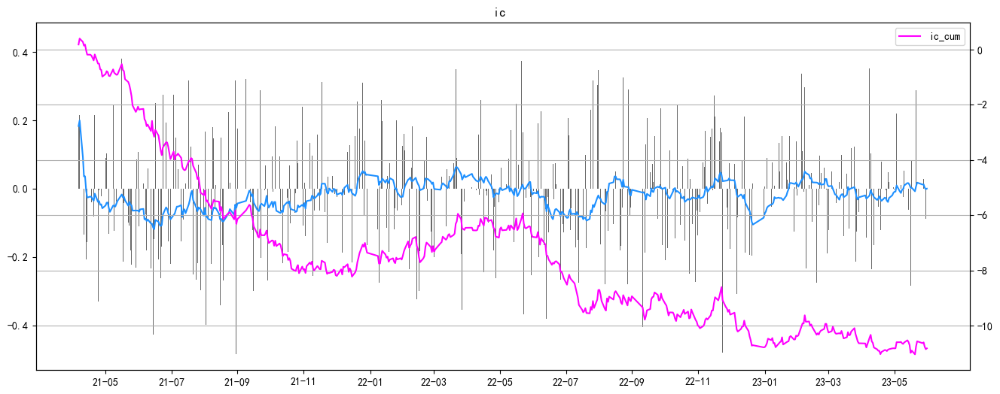

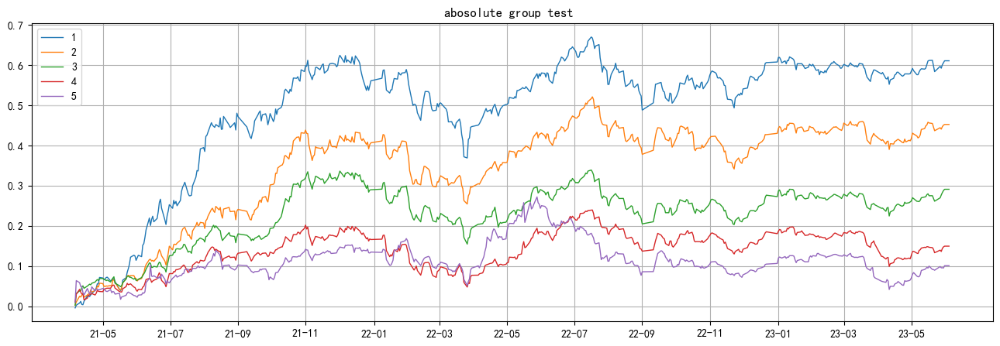

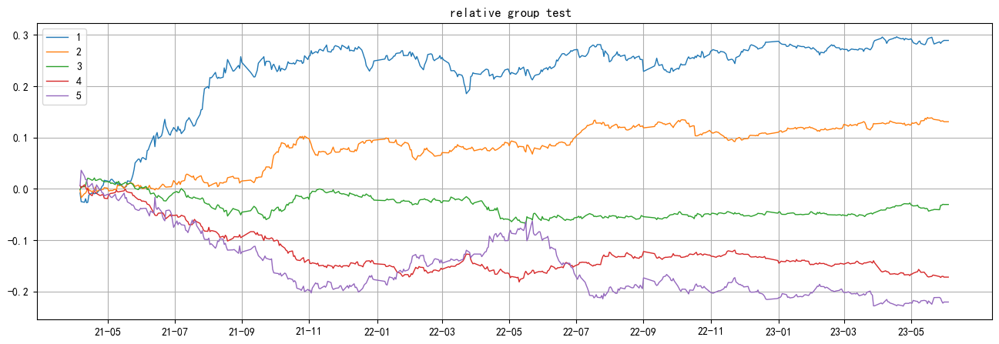

In [89]:
look(data17,factor,r,thresh=0.01, div_num=20)
analyse_ic(data17,factor,r)    
analyse_group_new(data17,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data17,factor,r,is_alpha=True,num_group=5)

<Figure size 1500x1200 with 0 Axes>

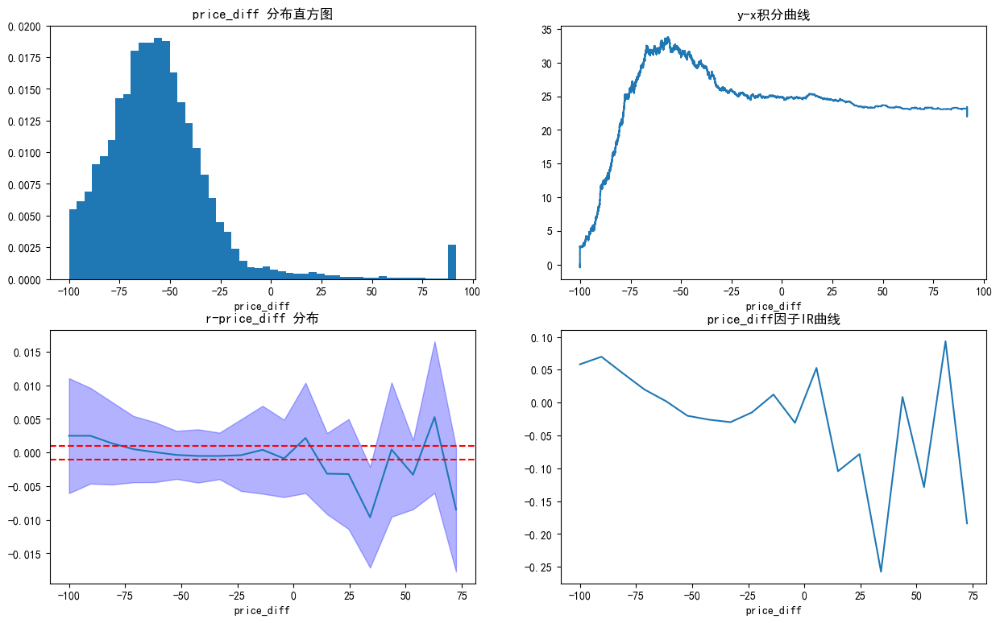

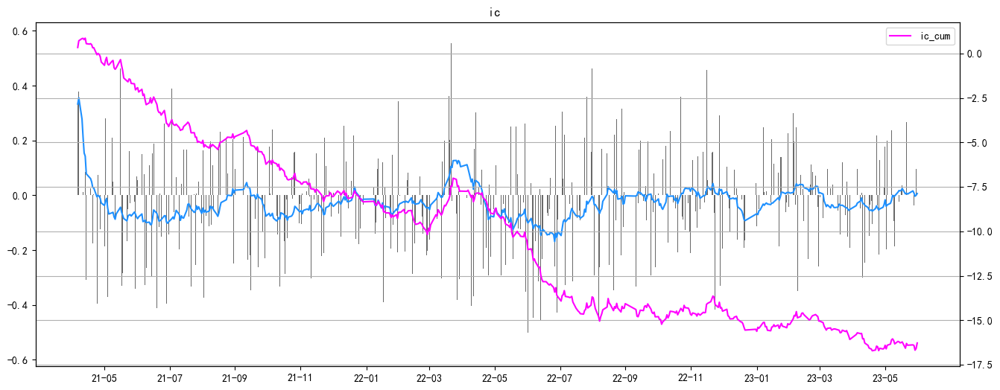

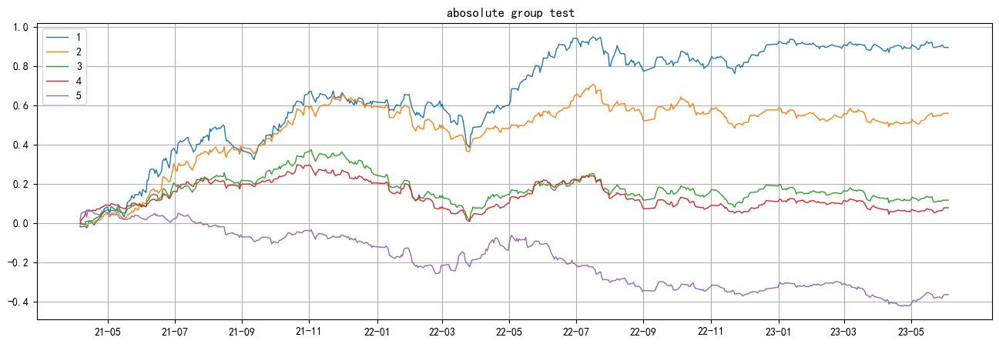

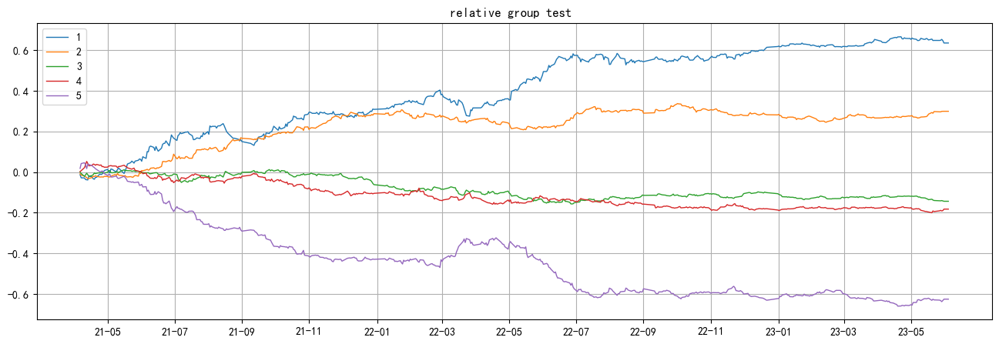

In [90]:
look(data18,factor,r,thresh=0.01, div_num=20)
analyse_ic(data18,factor,r)    
analyse_group_new(data18,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data18,factor,r,is_alpha=True,num_group=5)

### Categorize by convertible_bond_momentum

In [16]:
data['convertible_bond_momentum1'] = data.groupby(['date'])['convertible_bond_momentum'].transform(lambda x:x.quantile(0.25))#计算每个日期对应的四分位数
data['convertible_bond_momentum2'] = data.groupby(['date'])['convertible_bond_momentum'].transform(lambda x:x.quantile(0.75))
data19 = data[data['convertible_bond_momentum']<data['convertible_bond_momentum1']]
data20 = data[(data['convertible_bond_momentum']>=data['convertible_bond_momentum1'])&(data['convertible_bond_momentum']<data['convertible_bond_momentum2'])]
data21 = data[data['convertible_bond_momentum']>=data['convertible_bond_momentum2']]

In [17]:
data19

,date,order_book_id,close,conversion_value,conversion_premium,put_trigger_price,yield_to_maturity,pb_ratio,convertible_bond_momentum,stock_momentum,turnover_rate,r,price_diff,convertible_bond_momentum1,convertible_bond_momentum2
133153,2021-05-14,110031.XSHG,106.730,61.317254,0.740619,15.092,-0.133256,1.858019,0.000469,0.136716,0.017267,0.000562,-0.074514,0.003100,0.029378
136045,2021-05-26,110031.XSHG,106.810,59.137291,0.806136,15.092,-0.243230,1.858019,0.000281,-0.007011,0.008495,-0.001404,-0.076445,0.001099,0.022170
135069,2021-05-21,110033.XSHG,109.160,97.353760,0.121272,5.026,-0.040300,0.565588,-0.009707,-0.026464,0.004238,-0.003023,-51.462193,-0.009620,0.010627
135430,2021-05-24,110033.XSHG,109.040,97.214485,0.121644,5.026,-0.039102,0.565588,-0.006379,-0.018279,0.007080,0.003675,-51.439008,-0.003266,0.020739
135792,2021-05-25,110033.XSHG,109.220,97.632312,0.118687,5.026,-0.041885,0.565588,-0.004557,-0.012686,0.009319,0.004211,-52.009882,-0.002413,0.018754
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
304466,2023-02-14,128145.XSHE,134.811,134.899329,-0.000655,7.301,-5.813498,3.455567,-0.034651,-0.017458,0.470184,0.016868,-89.679166,-0.001197,0.016972
305417,2023-02-16,128145.XSHE,128.600,128.475551,0.000969,7.301,-5.705710,3.363541,-0.048113,-0.055673,1.340473,0.023838,-89.576179,-0.022095,-0.001504
306166,2023-02-20,128145.XSHE,131.670,132.598274,-0.007001,7.301,-8.652776,3.486537,-0.028266,-0.023305,1.621542,-0.009113,-90.747133,-0.024573,-0.005702
306644,2023-02-21,128145.XSHE,130.449,130.872483,-0.003236,7.301,-9.324585,3.471476,-0.032356,-0.029851,0.594014,0.000000,-90.230380,-0.020752,-0.003341


<Figure size 1500x1200 with 0 Axes>

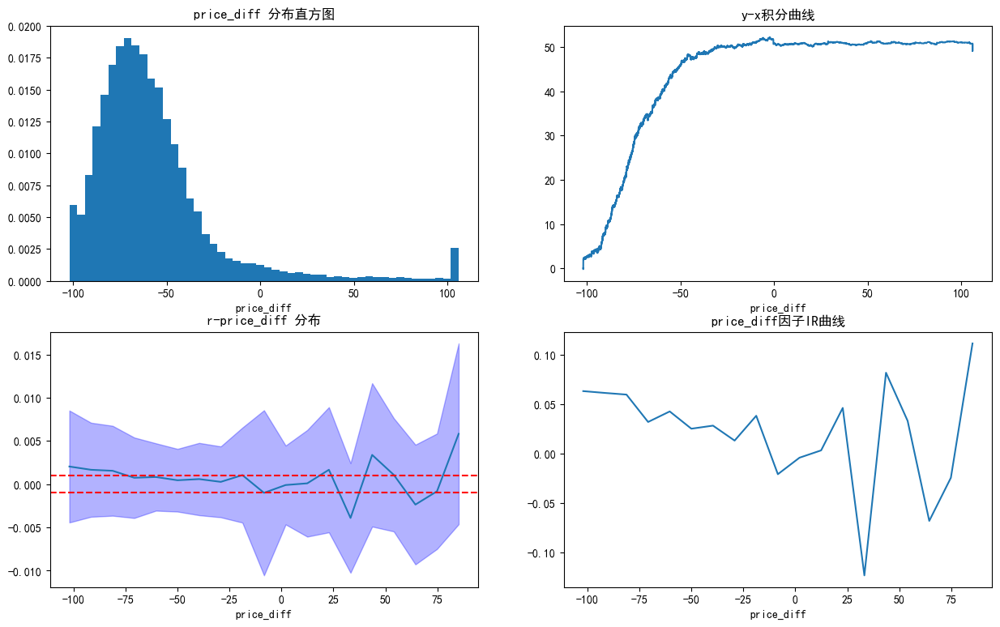

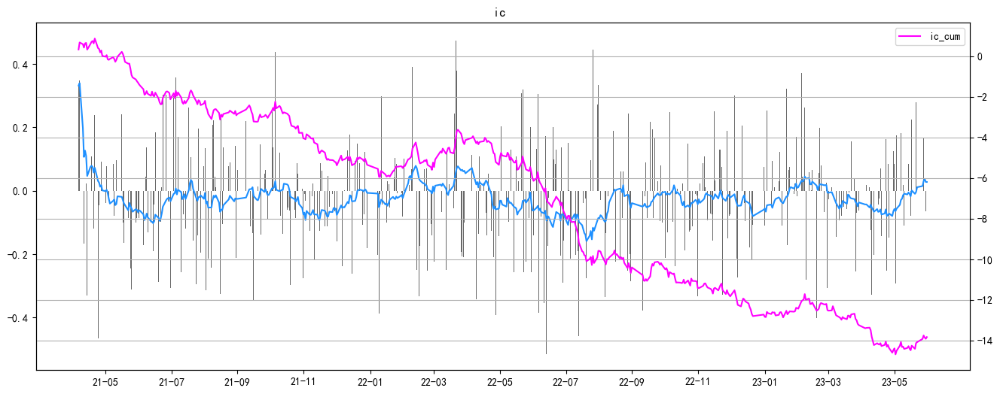

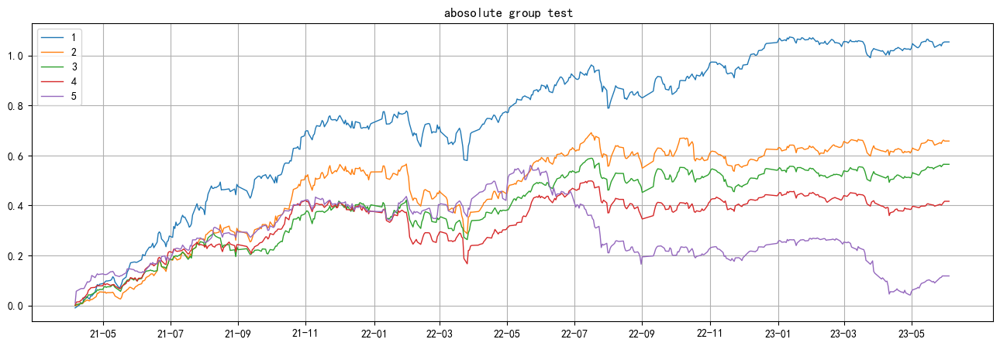

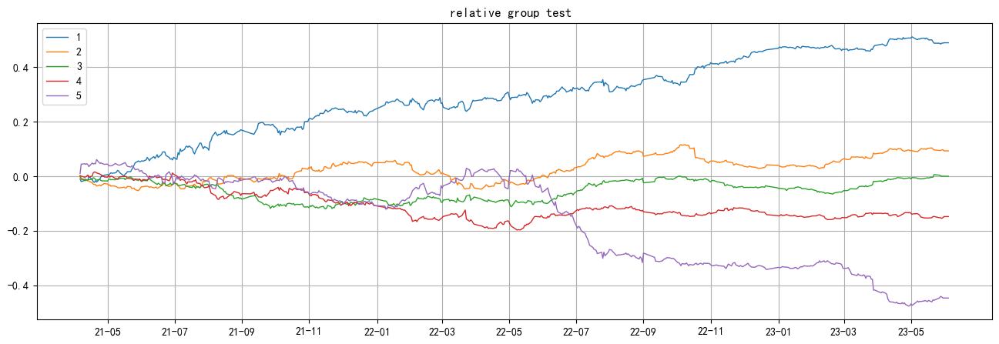

In [18]:
look(data19,factor,r,thresh=0.01, div_num=20)
analyse_ic(data19,factor,r)    
analyse_group_new(data19,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data19,factor,r,is_alpha=True,num_group=5)

<Figure size 1500x1200 with 0 Axes>

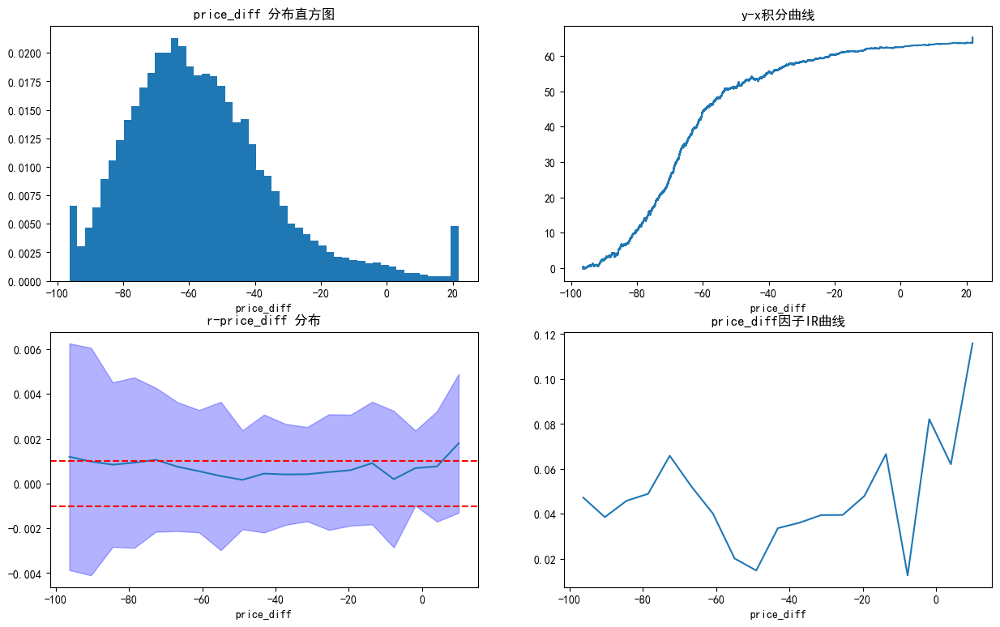

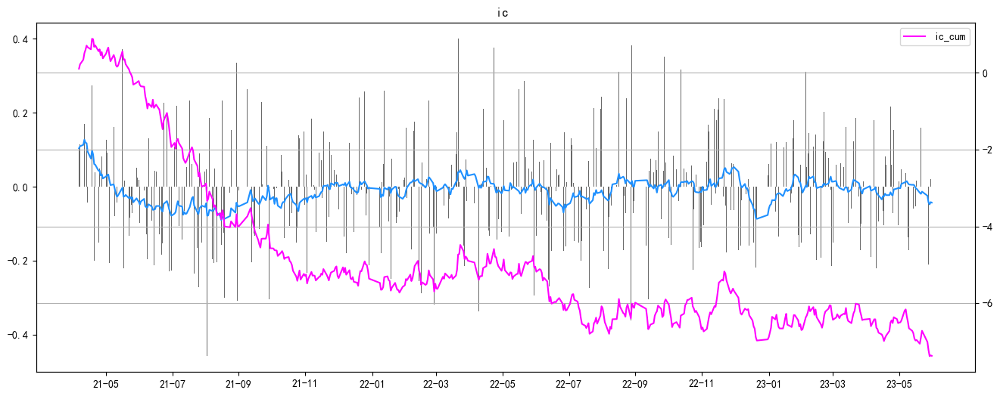

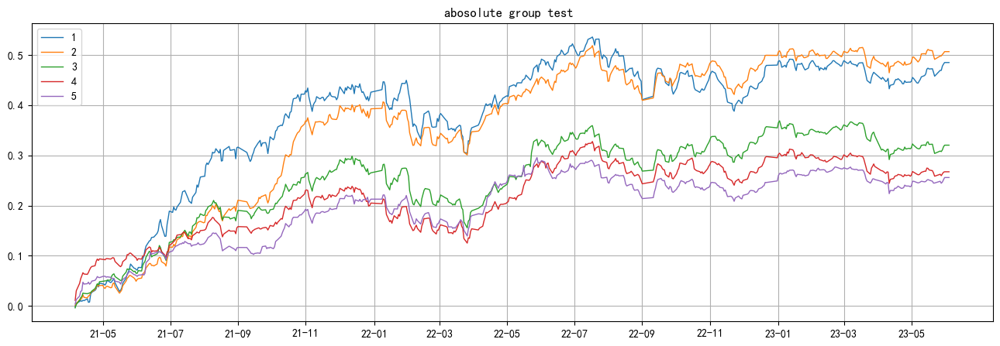

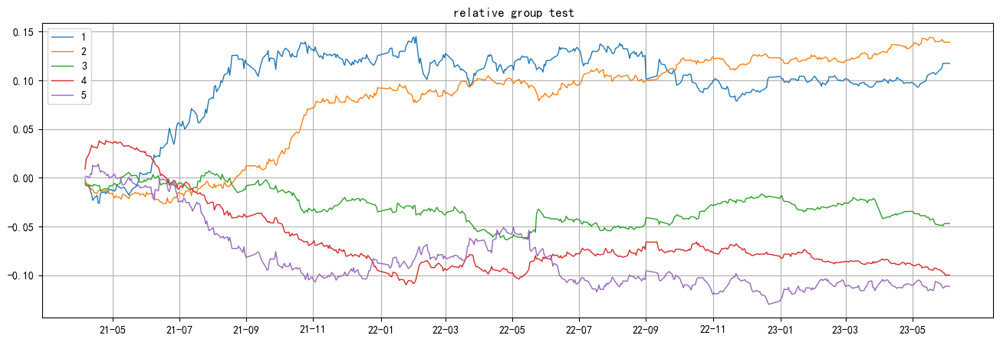

In [19]:
look(data20,factor,r,thresh=0.01, div_num=20)
analyse_ic(data20,factor,r)    
analyse_group_new(data20,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data20,factor,r,is_alpha=True,num_group=5)

<Figure size 1500x1200 with 0 Axes>

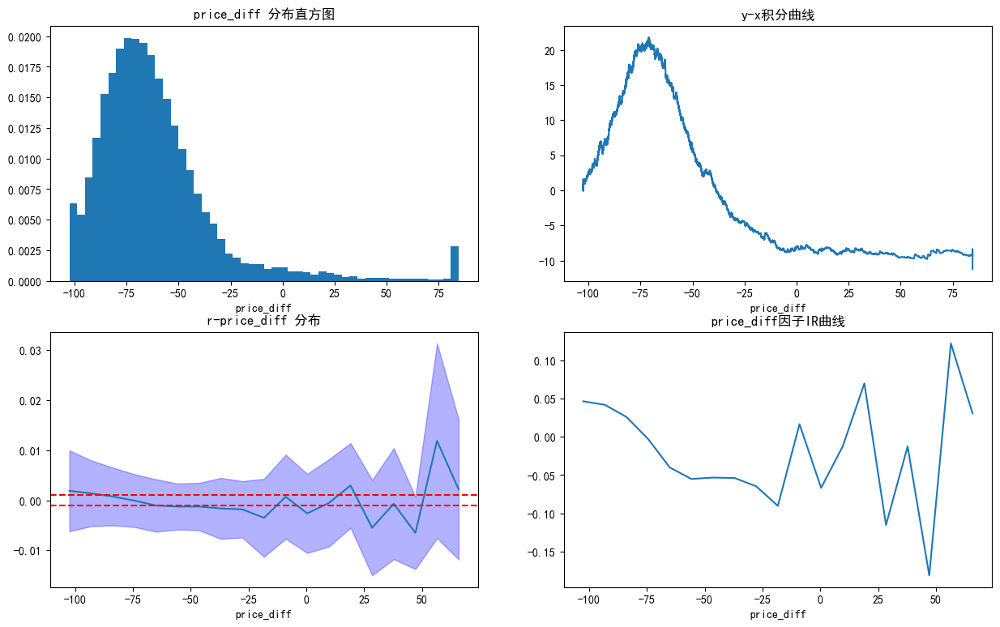

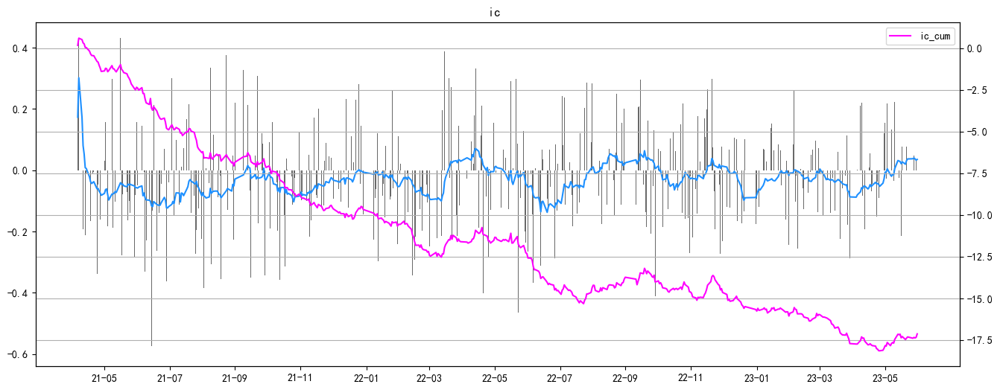

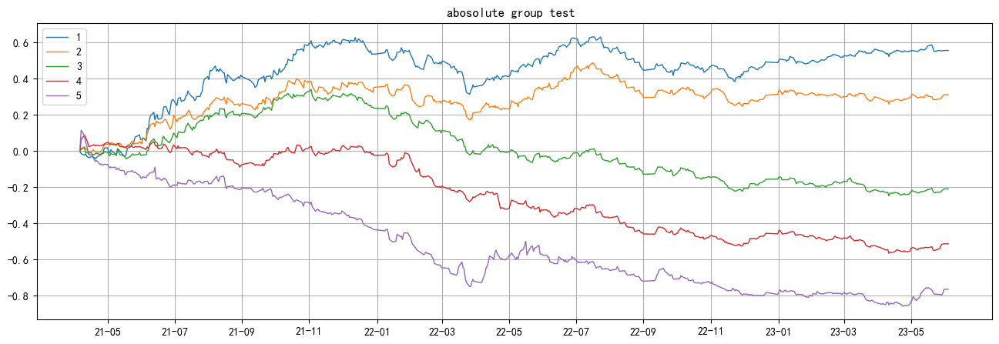

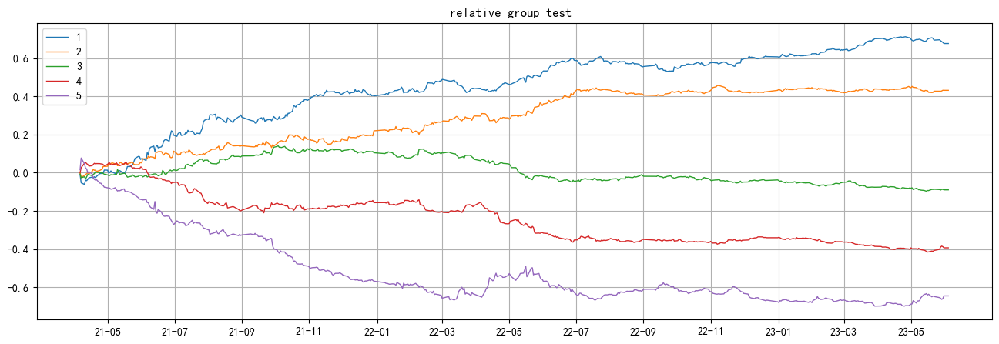

In [20]:
look(data21,factor,r,thresh=0.01, div_num=20)
analyse_ic(data21,factor,r)    
analyse_group_new(data21,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data21,factor,r,is_alpha=True,num_group=5)

### Categorize by stock_momentum

In [21]:
data['stock_momentum1'] = data.groupby(['date'])['stock_momentum'].transform(lambda x:x.quantile(0.25))#计算每个日期对应的四分位数
data['stock_momentum2'] = data.groupby(['date'])['stock_momentum'].transform(lambda x:x.quantile(0.75))
data22 = data[data['stock_momentum']<data['stock_momentum1']]
data23 = data[(data['stock_momentum']>=data['stock_momentum1'])&(data['stock_momentum']<data['stock_momentum2'])]
data24 = data[data['stock_momentum']>=data['stock_momentum2']]

<Figure size 1500x1200 with 0 Axes>

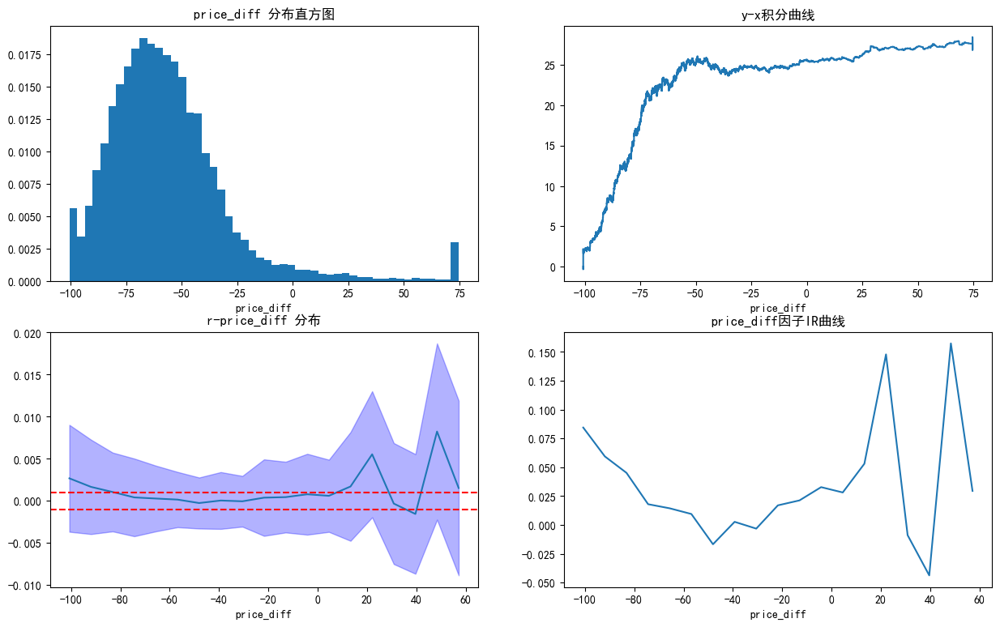

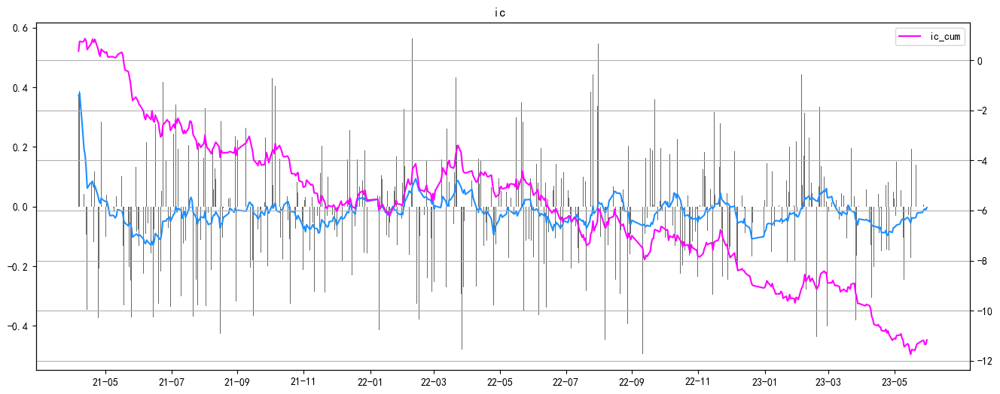

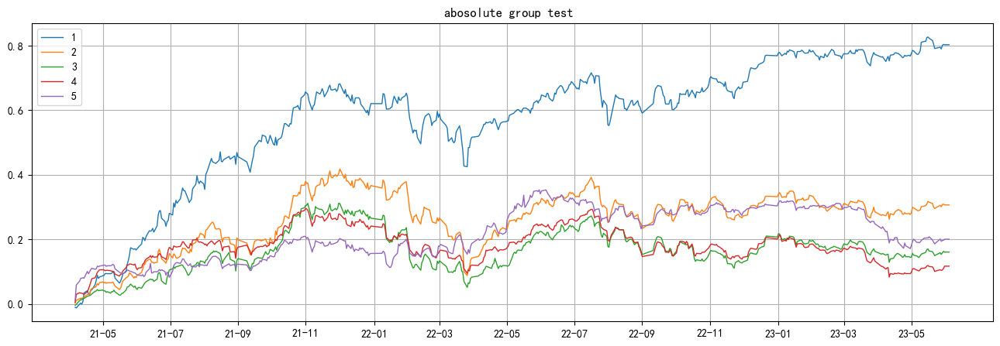

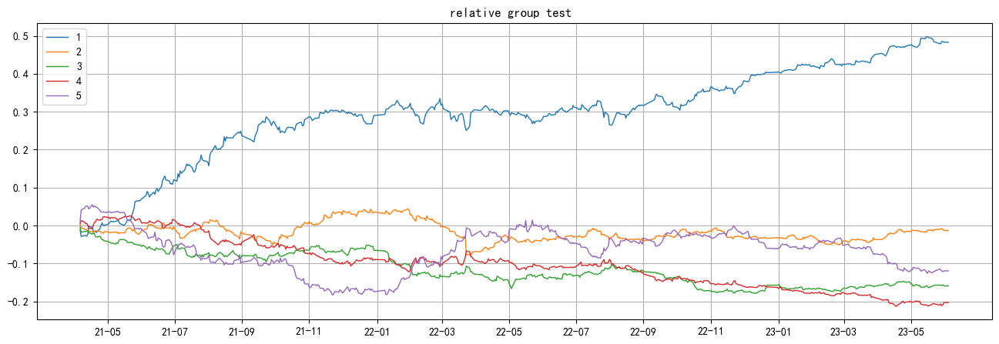

In [22]:
look(data22,factor,r,thresh=0.01, div_num=20)
analyse_ic(data22,factor,r)    
analyse_group_new(data22,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data22,factor,r,is_alpha=True,num_group=5)

<Figure size 1500x1200 with 0 Axes>

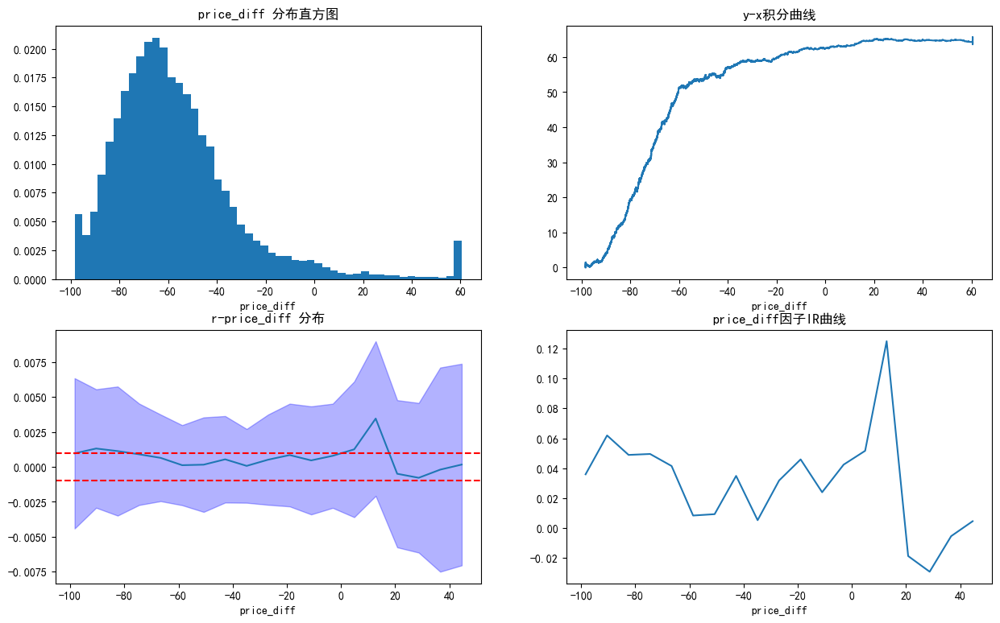

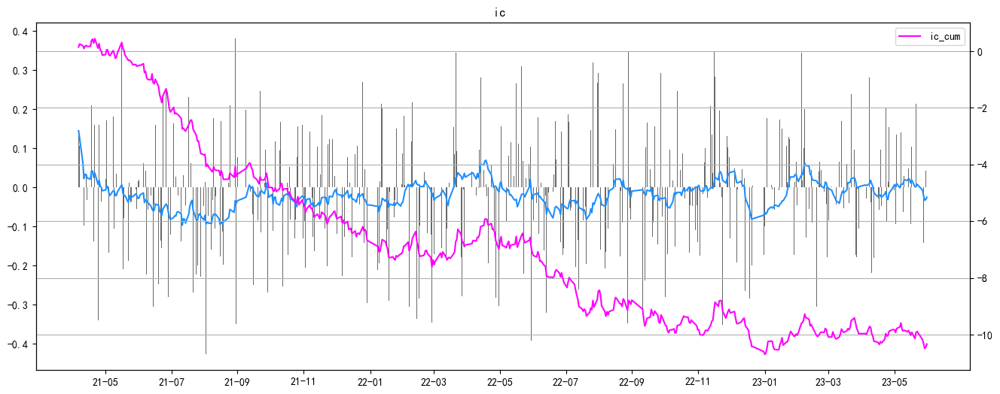

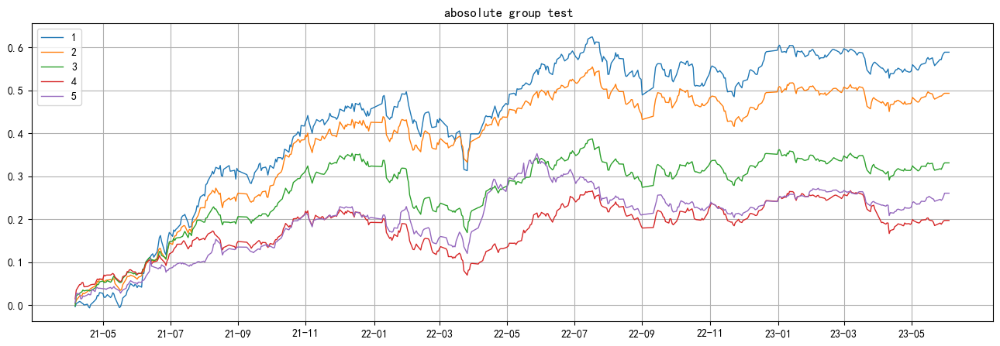

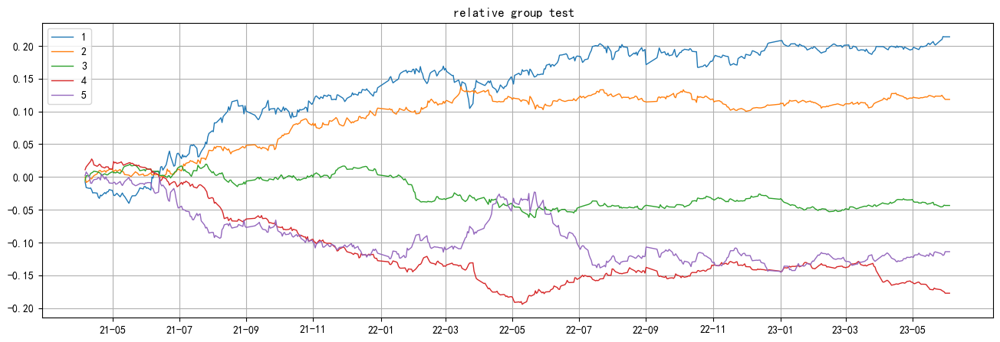

In [23]:
look(data23,factor,r,thresh=0.01, div_num=20)
analyse_ic(data23,factor,r)    
analyse_group_new(data23,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data23,factor,r,is_alpha=True,num_group=5)

<Figure size 1500x1200 with 0 Axes>

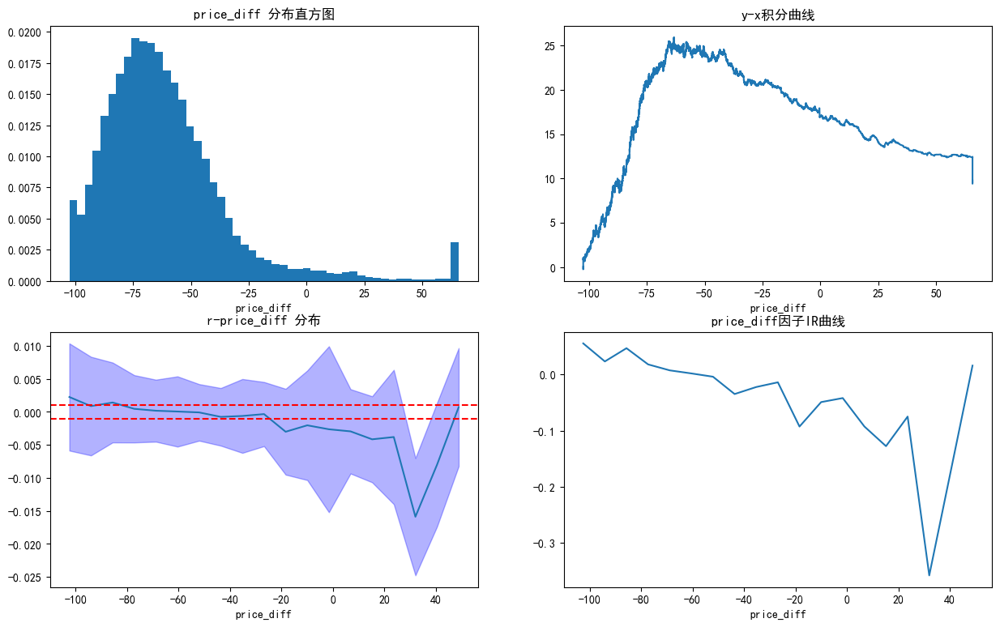

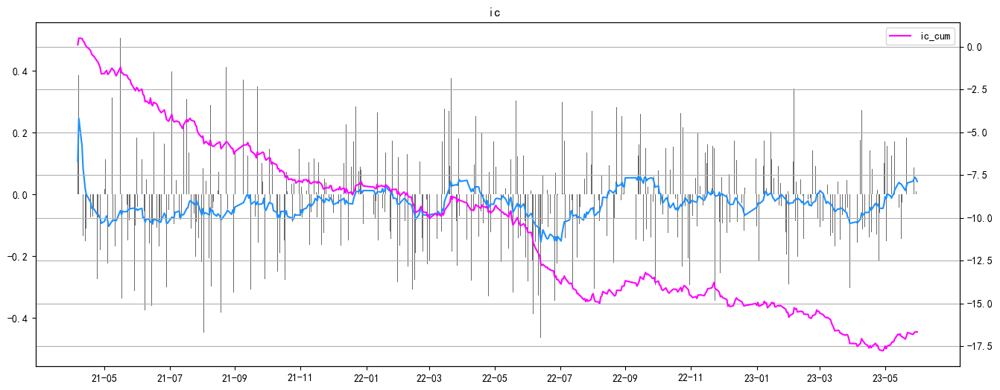

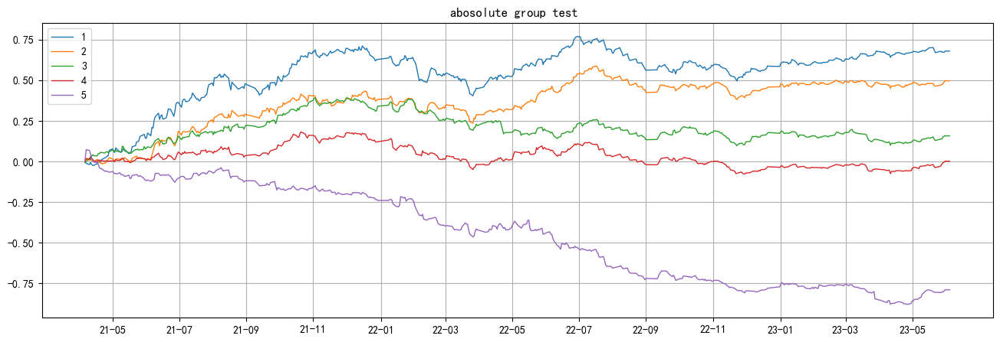

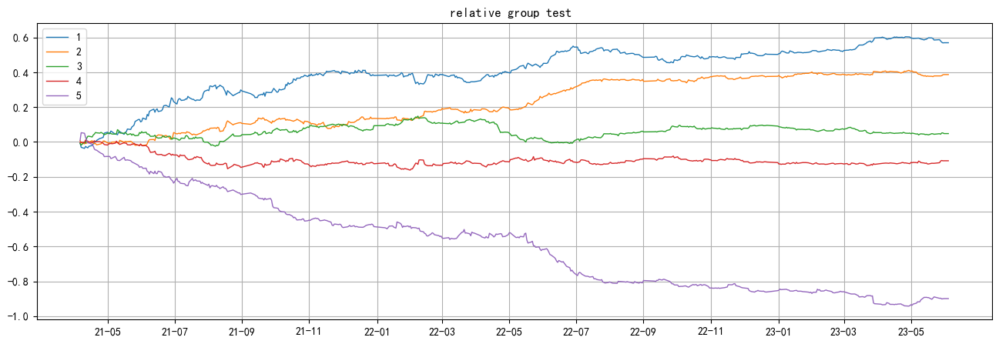

In [24]:
look(data24,factor,r,thresh=0.01, div_num=20)
analyse_ic(data24,factor,r)    
analyse_group_new(data24,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data24,factor,r,is_alpha=True,num_group=5)

### Categorize by turnover_rate

In [25]:
data['turnover_rate1'] = data.groupby(['date'])['turnover_rate'].transform(lambda x:x.quantile(0.25))#计算每个日期对应的四分位数
data['turnover_rate2'] = data.groupby(['date'])['turnover_rate'].transform(lambda x:x.quantile(0.75))
data25 = data[data['turnover_rate']<data['turnover_rate1']]
data26 = data[(data['turnover_rate']>=data['turnover_rate1'])&(data['turnover_rate']<data['turnover_rate2'])]
data27 = data[data['turnover_rate']>=data['turnover_rate2']]

<Figure size 1500x1200 with 0 Axes>

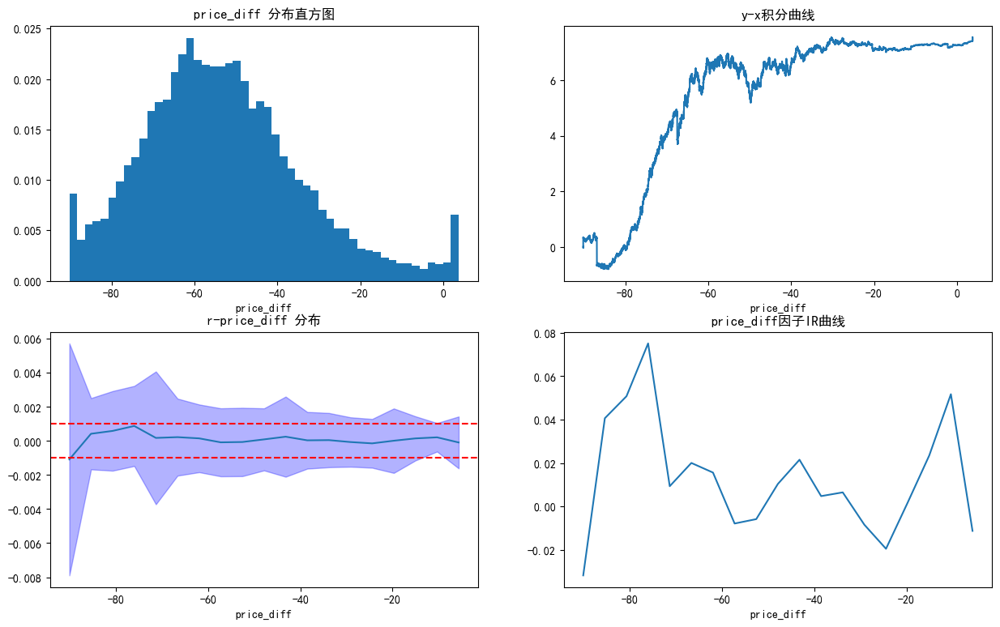

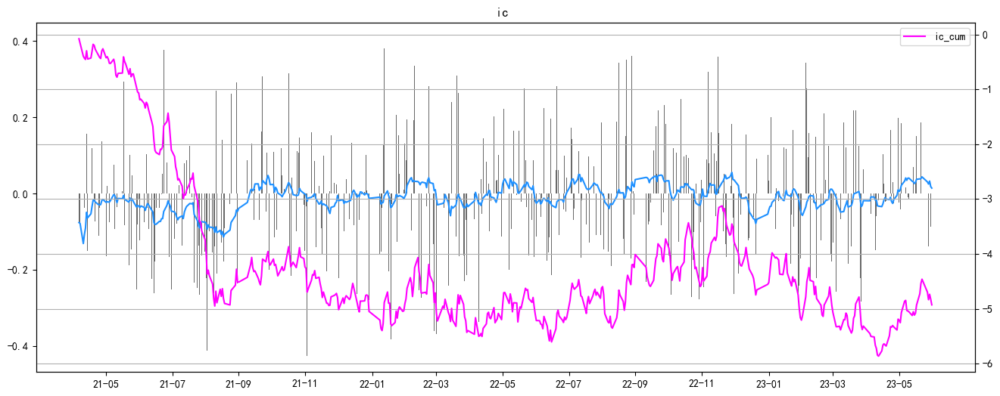

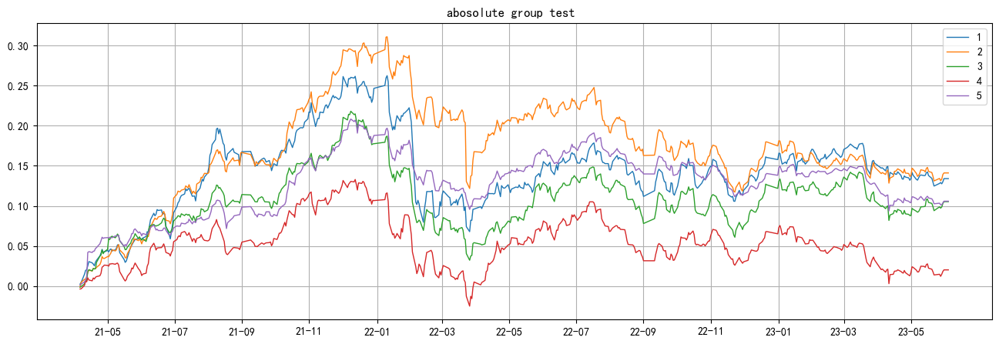

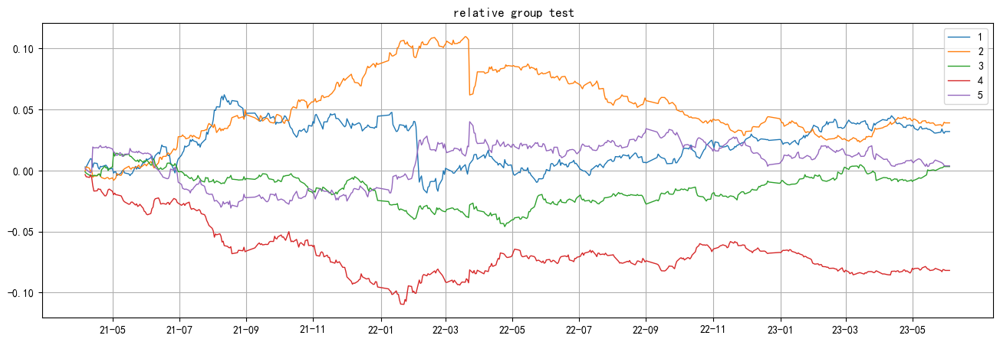

In [26]:
look(data25,factor,r,thresh=0.01, div_num=20)
analyse_ic(data25,factor,r)    
analyse_group_new(data25,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data25,factor,r,is_alpha=True,num_group=5)

<Figure size 1500x1200 with 0 Axes>

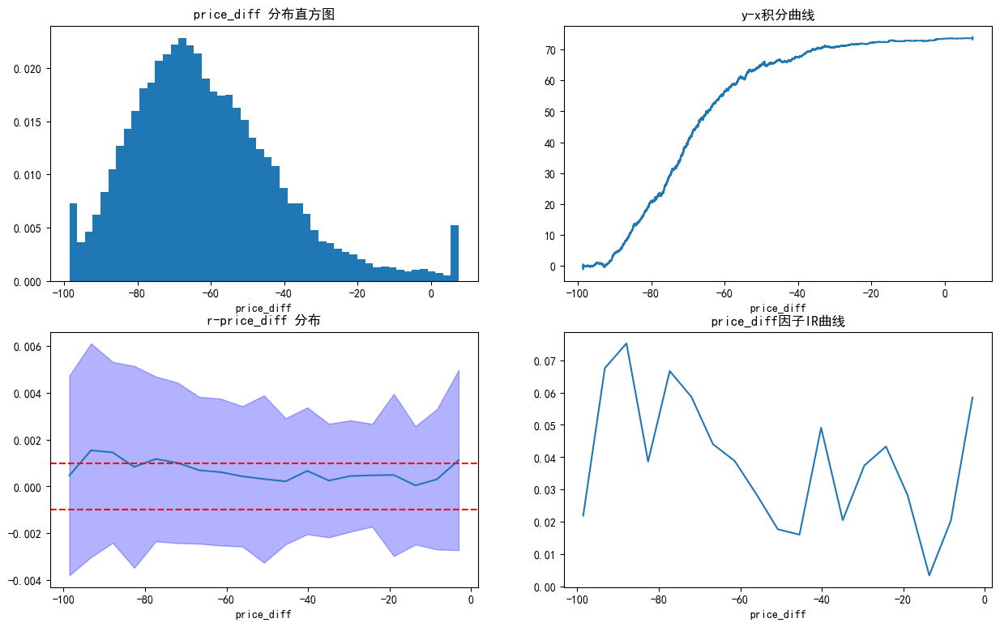

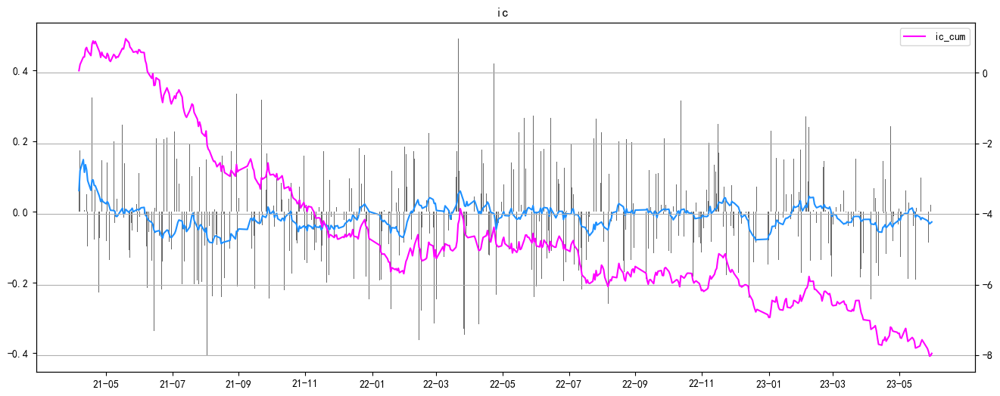

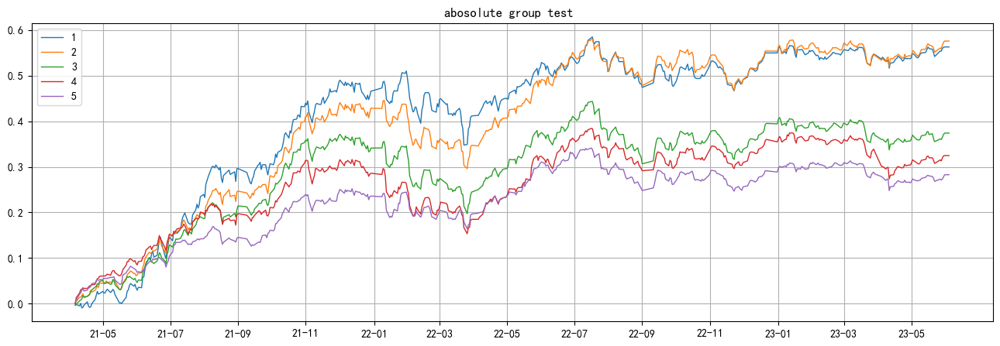

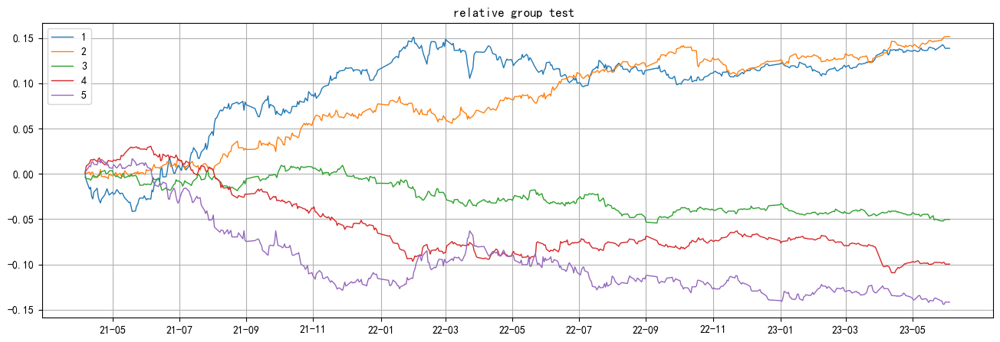

In [27]:
look(data26,factor,r,thresh=0.01, div_num=20)
analyse_ic(data26,factor,r)    
analyse_group_new(data26,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data26,factor,r,is_alpha=True,num_group=5)

<Figure size 1500x1200 with 0 Axes>

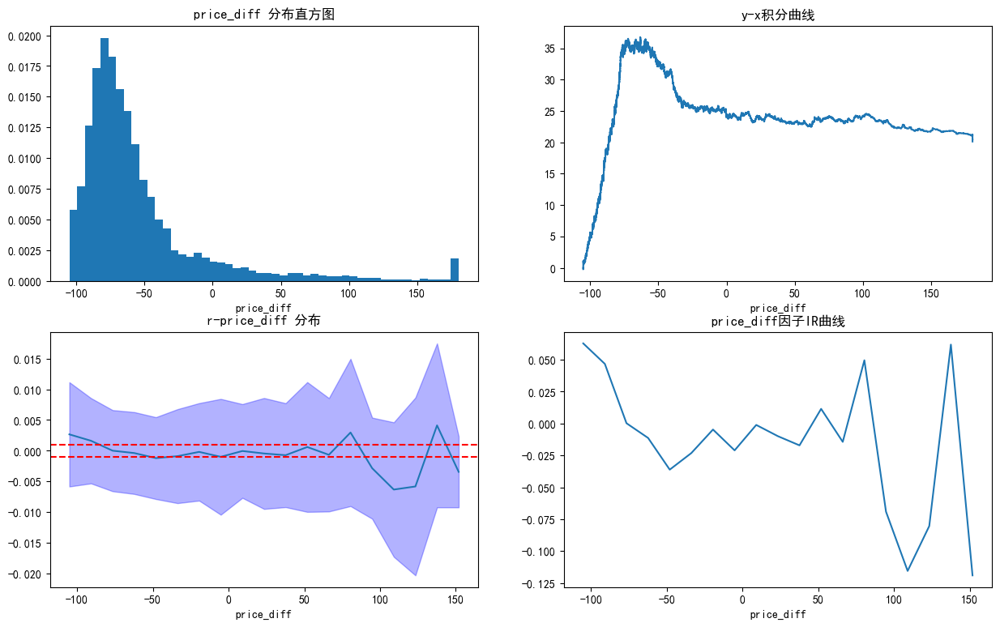

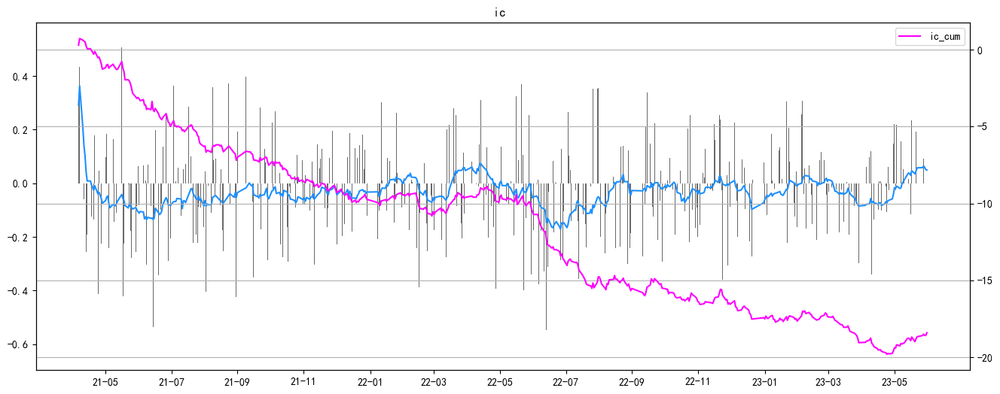

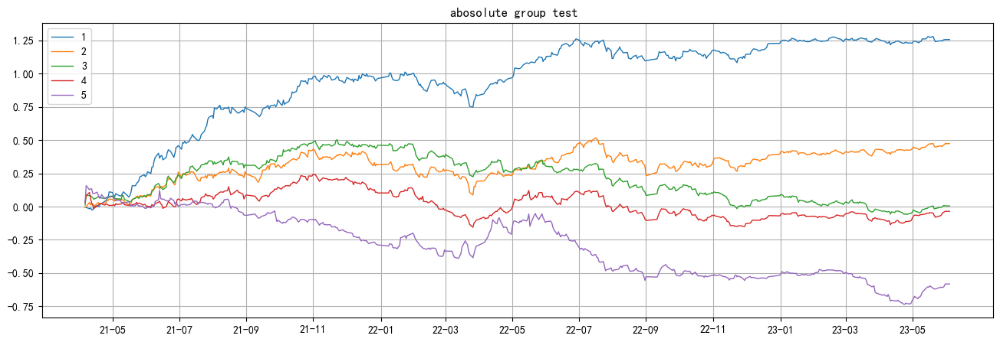

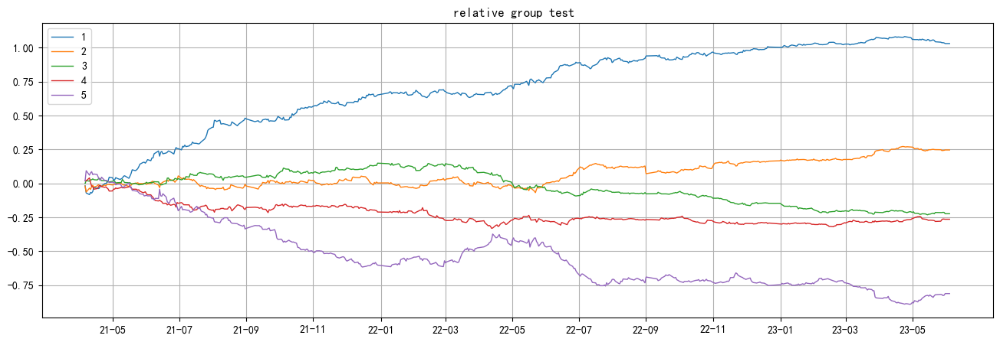

In [28]:
look(data27,factor,r,thresh=0.01, div_num=20)
analyse_ic(data27,factor,r)    
analyse_group_new(data27,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data27,factor,r,is_alpha=True,num_group=5)

### Combination of close and put_trigger_price

<Figure size 1500x1200 with 0 Axes>

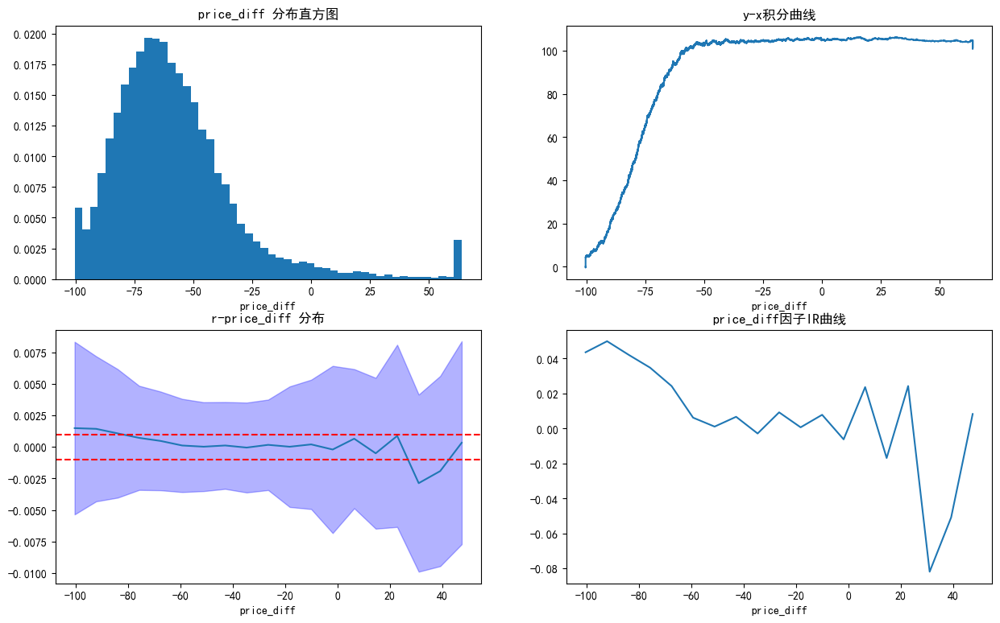

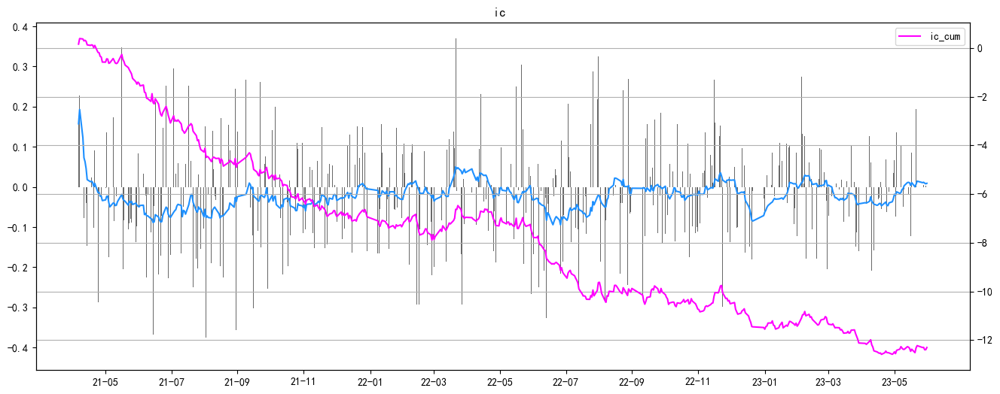

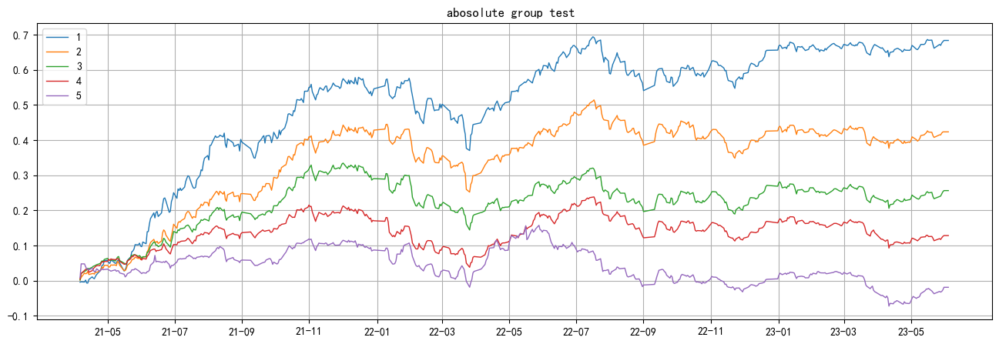

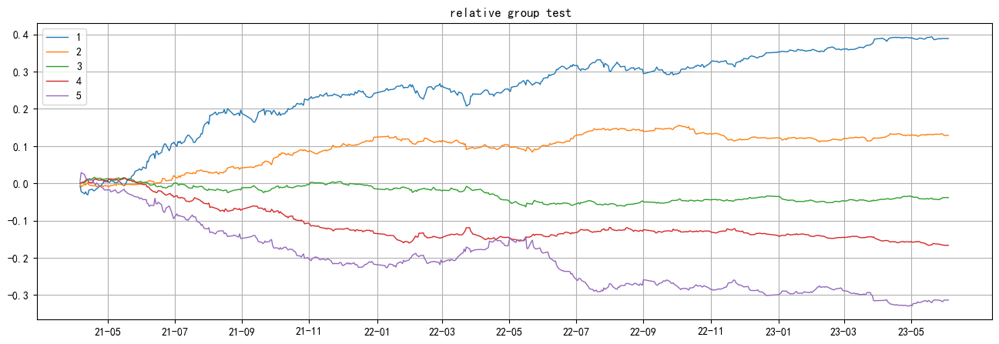

In [10]:
look(data,factor,r,thresh=0.01, div_num=20)
analyse_ic(data,factor,r)    
analyse_group_new(data,factor,r,is_alpha=False,num_group=5)
analyse_group_new(data,factor,r,is_alpha=True,num_group=5)

#### Method No.1

In [7]:
data['price_diff_mean'] = data.groupby(['date'])[factor].transform(lambda x:x.mean())
##筛选出满足两个指标的数据的并集,它们的new_factor就是原来的factor，其余数据的new_factor用原来factor的均值代替。
data['new_factor1'] = np.where(data.close>=data.close2,data[factor],np.nan)
data['new_factor1'] = np.where((data.put_trigger_price>=data.put_trigger_price1)&(data.put_trigger_price<data.put_trigger_price2),data[factor],data['new_factor1'])
#data['new_factor1'] = np.where(data['new_factor1'].isnull(),data['price_diff_mean'],data['new_factor1'])##用平均值代替缺失值

<Figure size 1500x1200 with 0 Axes>

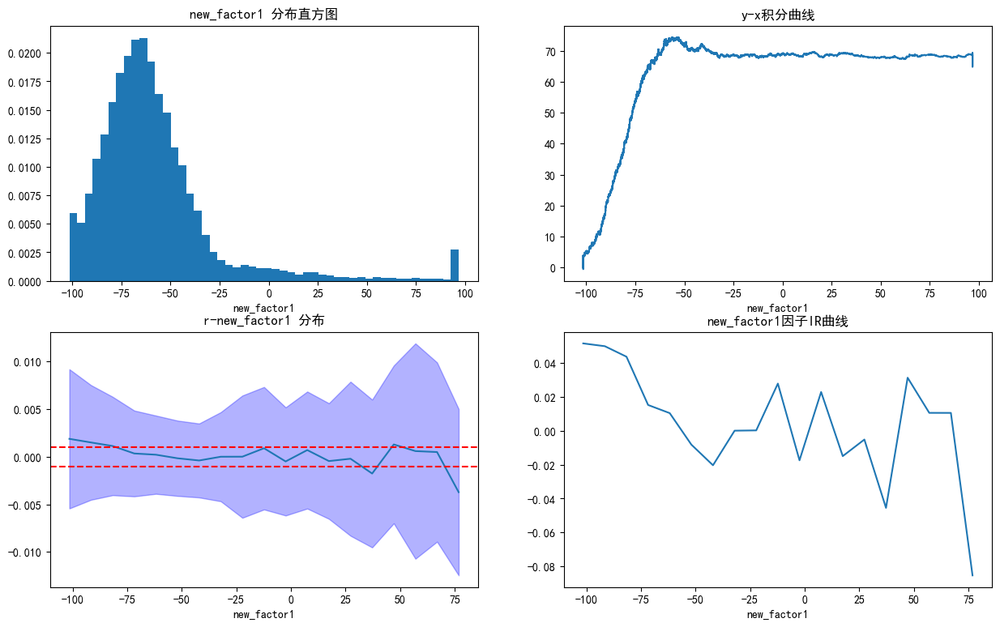

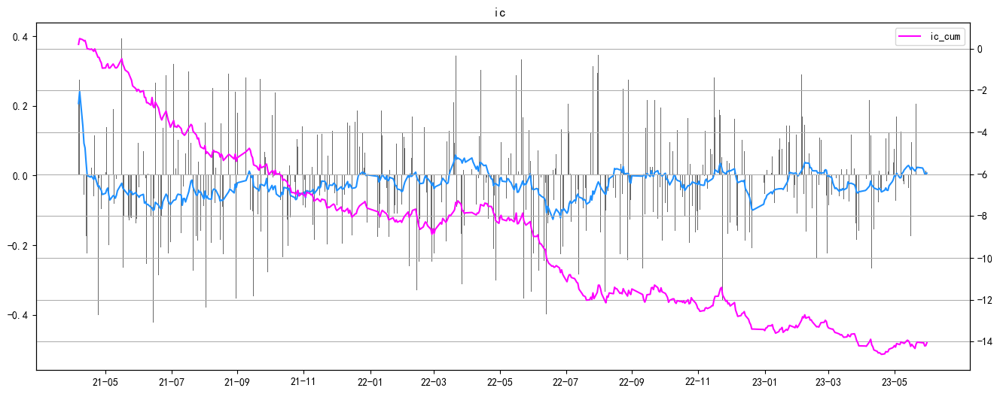

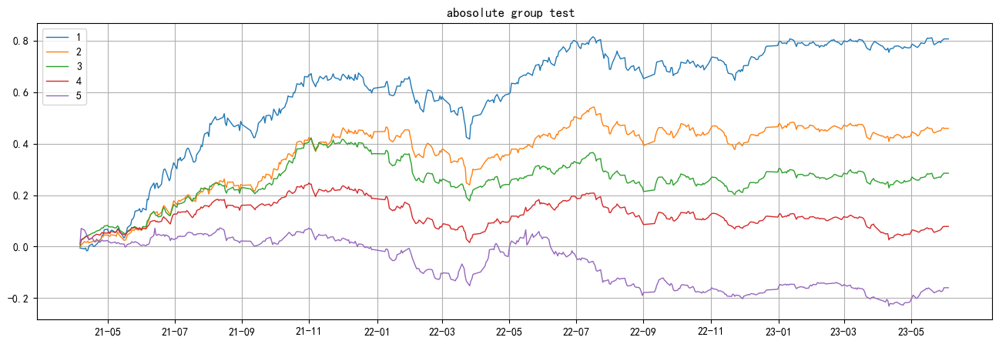

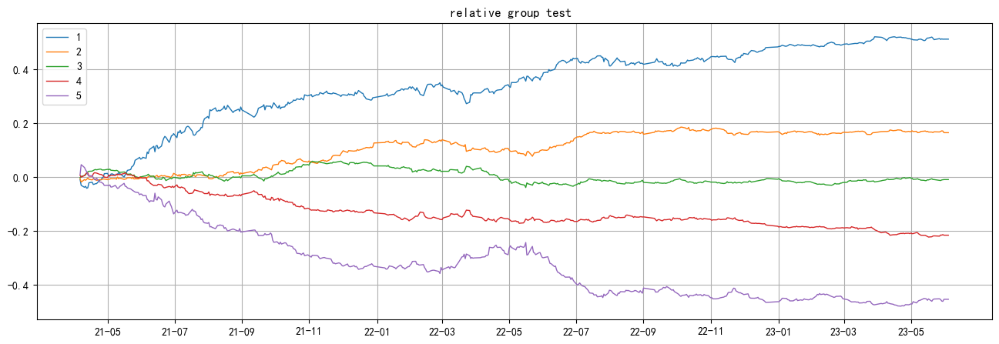

In [9]:
look(data,'new_factor1',r,thresh=0.01, div_num=20)
analyse_ic(data,'new_factor1',r)    
analyse_group_new(data,'new_factor1',r,is_alpha=False,num_group=5)
analyse_group_new(data,'new_factor1',r,is_alpha=True,num_group=5)

#### Method No.2

In [11]:
print(data.close.describe())
print(data.put_trigger_price.describe())

count    200101.000000
mean        137.603356
std          59.056480
min          18.002000
25%         113.510000
50%         121.775000
75%         136.500000
max        1907.000000
Name: close, dtype: float64
count    200101.000000
mean         15.401151
std          20.607157
min           0.588000
25%           5.663000
50%           9.604000
75%          16.982000
max         349.923000
Name: put_trigger_price, dtype: float64


In [15]:
##筛选出满足两个指标的数据的并集,它们的new_factor就是原来的factor，其余数据的new_factor用原来factor的均值代替。
data['new_factor2'] = np.where(data.close>=120,data[factor],np.nan)
data['new_factor2'] = np.where((data.put_trigger_price>=data.put_trigger_price1)&(data.put_trigger_price<data.put_trigger_price2),data[factor],data['new_factor2'])
#data['new_factor2'] = np.where(data['new_factor2'].isnull(),data['price_diff_mean'],data['new_factor2'])##用平均值代替缺失值

<Figure size 1500x1200 with 0 Axes>

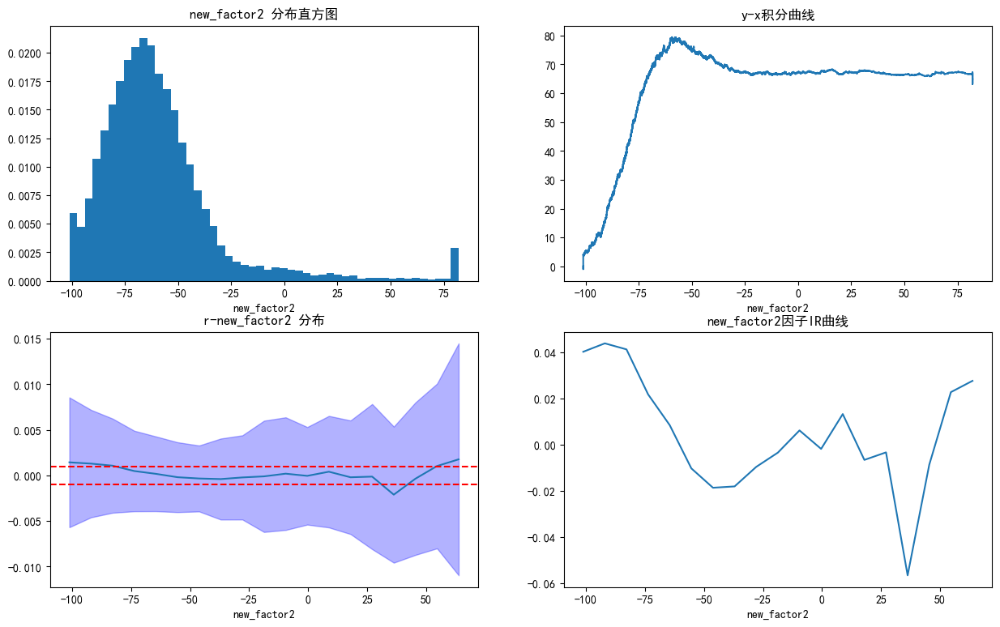

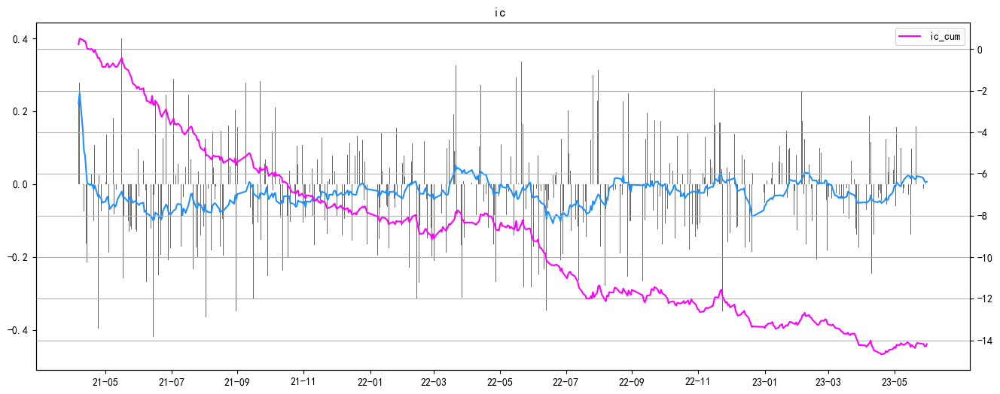

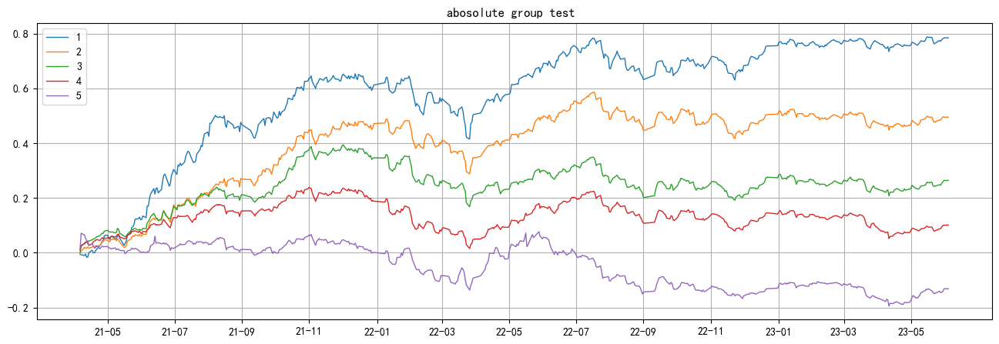

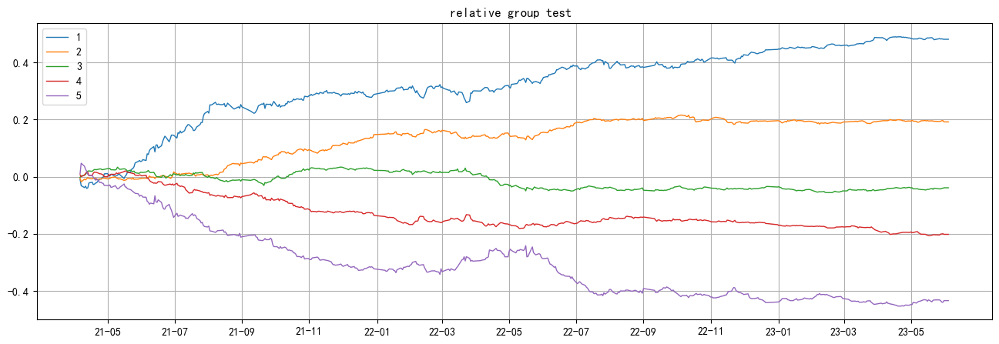

In [16]:
look(data,'new_factor2',r,thresh=0.01, div_num=20)
analyse_ic(data,'new_factor2',r)    
analyse_group_new(data,'new_factor2',r,is_alpha=False,num_group=5)
analyse_group_new(data,'new_factor2',r,is_alpha=True,num_group=5)

#### Method No.3

In [21]:
print(data.close.describe())
print(data.put_trigger_price.describe())

count    200101.000000
mean        137.603356
std          59.056480
min          18.002000
25%         113.510000
50%         121.775000
75%         136.500000
max        1907.000000
Name: close, dtype: float64
count    200101.000000
mean         15.401151
std          20.607157
min           0.588000
25%           5.663000
50%           9.604000
75%          16.982000
max         349.923000
Name: put_trigger_price, dtype: float64


In [25]:
##筛选出满足两个指标的数据的并集,它们的new_factor就是原来的factor，其余数据的new_factor用原来factor的均值代替。
data['new_factor3'] = np.where(data.close>=120,data[factor],np.nan)
data['new_factor3'] = np.where(data.put_trigger_price<20,data[factor],data['new_factor3'])
#data['new_factor3'] = np.where(data['new_factor3'].isnull(),data['price_diff_mean'],data['new_factor3'])##用平均值代替缺失值

<Figure size 1500x1200 with 0 Axes>

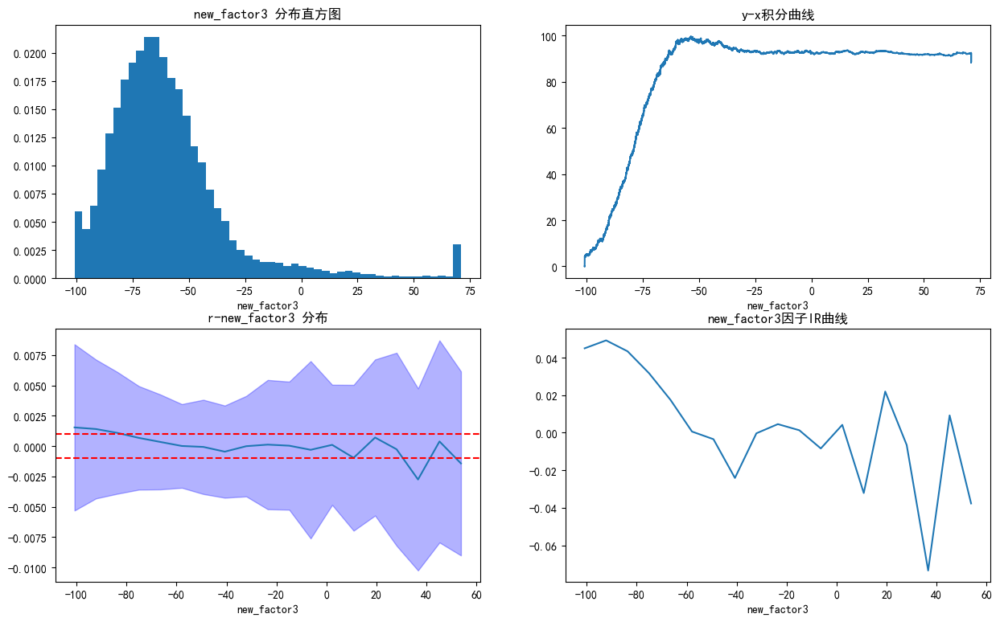

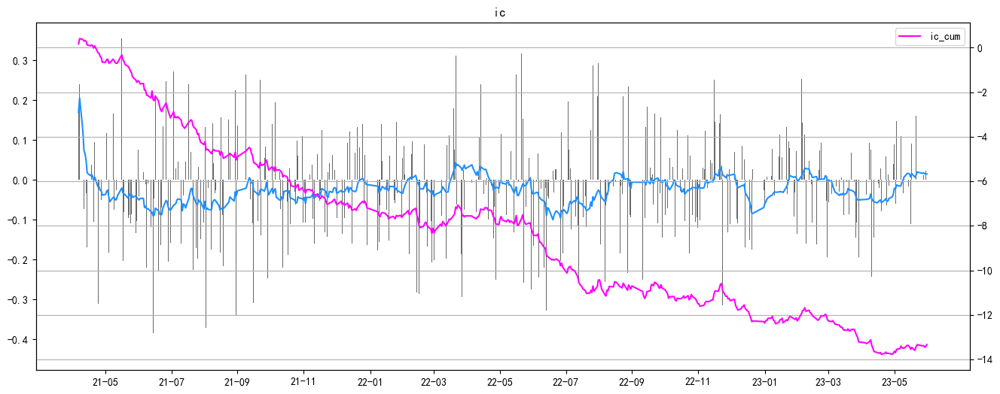

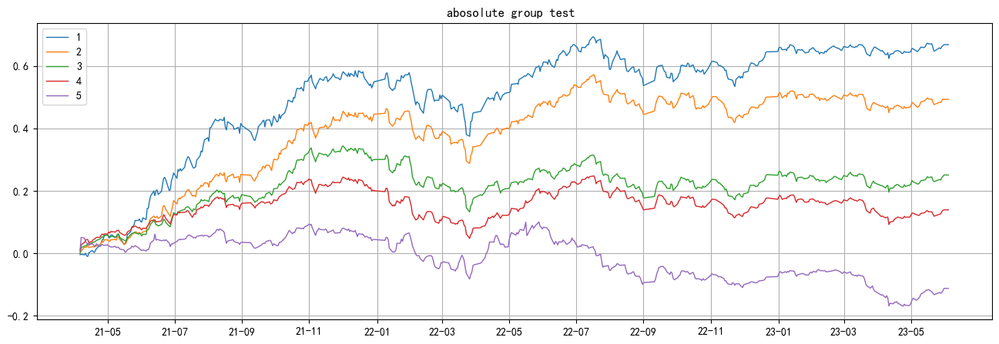

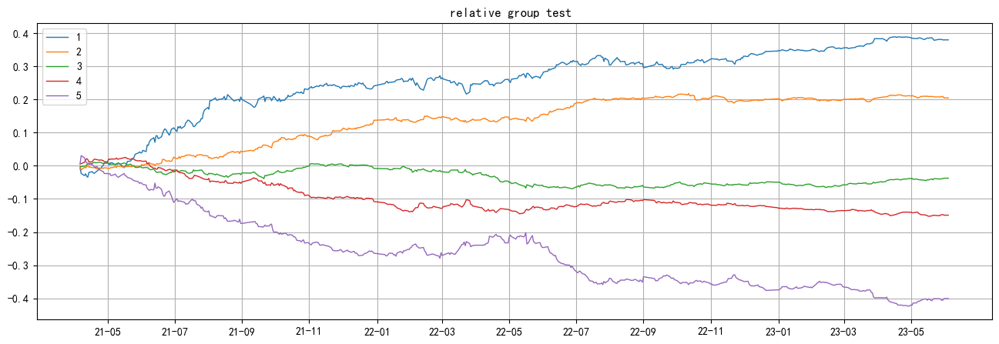

In [26]:
look(data,'new_factor3',r,thresh=0.01, div_num=20)
analyse_ic(data,'new_factor3',r)    
analyse_group_new(data,'new_factor3',r,is_alpha=False,num_group=5)
analyse_group_new(data,'new_factor3',r,is_alpha=True,num_group=5)